#  Data Science Model Development By Kapil Verma

In [316]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib as plt
from matplotlib import pyplot
import seaborn as sns
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')

In [2]:
file=r'C:\Users\Kapil\Downloads\imports-85.data.txt'

In [3]:
df=pd.read_csv(file,header=None)

In [4]:
df.shape

(205, 26)

In [5]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450


In [6]:
df.tail()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
200,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845
201,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045
202,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485
203,-1,95,volvo,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.40,23.0,106,4800,26,27,22470
204,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,19,25,22625


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       205 non-null    int64  
 1   1       205 non-null    object 
 2   2       205 non-null    object 
 3   3       205 non-null    object 
 4   4       205 non-null    object 
 5   5       205 non-null    object 
 6   6       205 non-null    object 
 7   7       205 non-null    object 
 8   8       205 non-null    object 
 9   9       205 non-null    float64
 10  10      205 non-null    float64
 11  11      205 non-null    float64
 12  12      205 non-null    float64
 13  13      205 non-null    int64  
 14  14      205 non-null    object 
 15  15      205 non-null    object 
 16  16      205 non-null    int64  
 17  17      205 non-null    object 
 18  18      205 non-null    object 
 19  19      205 non-null    object 
 20  20      205 non-null    float64
 21  21      205 non-null    object 
 22  22

In [8]:
df.dtypes

0       int64
1      object
2      object
3      object
4      object
5      object
6      object
7      object
8      object
9     float64
10    float64
11    float64
12    float64
13      int64
14     object
15     object
16      int64
17     object
18     object
19     object
20    float64
21     object
22     object
23      int64
24      int64
25     object
dtype: object

In [9]:
df.describe()

,0,9,10,11,12,13,16,20,23,24
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.834146,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,10.142537,25.219512,30.751220
std,1.245307,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,3.972040,6.542142,6.886443
min,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,7.000000,13.000000,16.000000
25%,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,8.600000,19.000000,25.000000
50%,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,9.000000,24.000000,30.000000
75%,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,9.400000,30.000000,34.000000
max,3.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,23.000000,49.000000,54.000000


In [10]:
df.describe(include='all')

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
count,205.000000,205,205,205,205,205,205,205,205,205.000000,...,205.000000,205,205,205,205.000000,205,205,205.000000,205.000000,205
unique,NaN,52,22,2,2,3,5,3,2,NaN,...,NaN,8,39,37,NaN,60,24,NaN,NaN,187
top,NaN,?,toyota,gas,std,four,sedan,fwd,front,NaN,...,NaN,mpfi,3.62,3.40,NaN,68,5500,NaN,NaN,?
freq,NaN,41,32,185,168,114,96,120,202,NaN,...,NaN,94,23,20,NaN,19,37,NaN,NaN,4
mean,0.834146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.756585,...,126.907317,NaN,NaN,NaN,10.142537,NaN,NaN,25.219512,30.751220,NaN
std,1.245307,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.021776,...,41.642693,NaN,NaN,NaN,3.972040,NaN,NaN,6.542142,6.886443,NaN
min,-2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.600000,...,61.000000,NaN,NaN,NaN,7.000000,NaN,NaN,13.000000,16.000000,NaN
25%,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.500000,...,97.000000,NaN,NaN,NaN,8.600000,NaN,NaN,19.000000,25.000000,NaN
50%,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.000000,...,120.000000,NaN,NaN,NaN,9.000000,NaN,NaN,24.000000,30.000000,NaN
75%,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102.400000,...,141.000000,NaN,NaN,NaN,9.400000,NaN,NaN,30.000000,34.000000,NaN


In [11]:
pd.set_option('display.max.rows',205)

In [12]:
pd.set_option('display.max.columns',26)

In [13]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,?,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,?,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,?,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,?


In [14]:
df.loc()

In [15]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,?,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,?,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,?,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,?


# <span style="color:green">Assigning Headers</span>



In [16]:
headers = ["symboling","normalized-losses","make","fuel-type","aspiration", "num-of-doors","body-style",
         "drive-wheels","engine-location","wheel-base", "length","width","height","curb-weight","engine-type",
         "num-of-cylinders", "engine-size","fuel-system","bore","stroke","compression-ratio","horsepower",
         "peak-rpm","city-mpg","highway-mpg","price"]

In [17]:
df.columns=headers

In [18]:
df.columns

Index(['symboling', 'normalized-losses', 'make', 'fuel-type', 'aspiration',
       'num-of-doors', 'body-style', 'drive-wheels', 'engine-location',
       'wheel-base', 'length', 'width', 'height', 'curb-weight', 'engine-type',
       'num-of-cylinders', 'engine-size', 'fuel-system', 'bore', 'stroke',
       'compression-ratio', 'horsepower', 'peak-rpm', 'city-mpg',
       'highway-mpg', 'price'],
      dtype='object')

# Some inportant information about the data

1. The first attribute, symboling, corresponds to the insurance risk level of a car. Cars are initially assigned a risk factor symbol associated with their price. Then, if an automobile is more risky, this symbol is adjusted by moving it up the scale. A value of +3 indicates that the auto is risky, -3, that it's probably pretty safe.

2. The second attribute, normalized losses, is the relative average loss payment per insured vehicle year. This value is normalized for all autos within a particular size classification two door small, station wagons, sports specialty, etc, and represents the average loss per car per year. The values range from 65 to 256.

In [19]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,?,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,?,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,?,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,?


# There are many missing values in the data lets replace them with NaN 

    NaN -> not a number

In [20]:
df=df.replace('?',np.NaN)


In [21]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,NaN


# Make a copy of original DataFrame 

In [22]:
df1=df.copy()

In [23]:
df1

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,NaN


# Finding out Unique Values 

In [24]:
df1['make'].unique()

array(['alfa-romero', 'audi', 'bmw', 'chevrolet', 'dodge', 'honda',
       'isuzu', 'jaguar', 'mazda', 'mercedes-benz', 'mercury',
       'mitsubishi', 'nissan', 'peugot', 'plymouth', 'porsche', 'renault',
       'saab', 'subaru', 'toyota', 'volkswagen', 'volvo'], dtype=object)

In [25]:
df1['body-style'].unique()

array(['convertible', 'hatchback', 'sedan', 'wagon', 'hardtop'],
      dtype=object)

# Created another DataFrame With Three Columns To find Average

In [26]:
df1_grp_make_body_style = df1[ ['make','body-style','price'] ]

In [27]:
df1_grp_make_body_style.dtypes

make          object
body-style    object
price         object
dtype: object

# Replacing the NaN with 0 to find out the mean price of Car Models

In [28]:
df1_grp_make_body_style ['price'] = df1_grp_make_body_style['price'].replace(np.NaN,0)

C:\Users\Kapil\AppData\Local\Temp\ipykernel_29436\2924953996.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1_grp_make_body_style ['price'] = df1_grp_make_body_style['price'].replace(np.NaN,0)


In [29]:
df1_grp_make_body_style


,make,body-style,price
0,alfa-romero,convertible,13495
1,alfa-romero,convertible,16500
2,alfa-romero,hatchback,16500
3,audi,sedan,13950
4,audi,sedan,17450
5,audi,sedan,15250
6,audi,sedan,17710
7,audi,wagon,18920
8,audi,sedan,23875
9,audi,hatchback,0


# Changing The Data Type For Column Price

In [30]:
df1_grp_make_body_style['price'] = df1_grp_make_body_style['price'].astype(int)

C:\Users\Kapil\AppData\Local\Temp\ipykernel_29436\3196175452.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1_grp_make_body_style['price'] = df1_grp_make_body_style['price'].astype(int)


In [31]:
df1_grp_make_body_style.dtypes

make          object
body-style    object
price          int32
dtype: object

# Finding the average price of each brand body style price

In [32]:
df1_grp_make_body_style = df1_grp_make_body_style.groupby( ['make', 'body-style'] )['price'].mean().reset_index()

In [33]:
df1_grp_make_body_style

,make,body-style,price
0,alfa-romero,convertible,14997.500000
1,alfa-romero,hatchback,16500.000000
2,audi,hatchback,0.000000
3,audi,sedan,17647.000000
4,audi,wagon,18920.000000
5,bmw,sedan,26118.750000
6,chevrolet,hatchback,5723.000000
7,chevrolet,sedan,6575.000000
8,dodge,hatchback,7819.800000
9,dodge,sedan,7619.666667


# Check the index where we want to replace the value by Average

In [34]:
df1

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,NaN


# Made changes at the specific locations

In [35]:
df.at[129,'price']=11009

In [36]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,NaN


# Replacing NaN with 0 and changing the Price Datatype to the original DF

In [37]:
df['price'] = df['price'].replace(np.NaN,0)

In [38]:
df['price'] = df['price'].astype(int)

In [39]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0


In [40]:
df.dtypes

symboling              int64
normalized-losses     object
make                  object
fuel-type             object
aspiration            object
num-of-doors          object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                  object
stroke                object
compression-ratio    float64
horsepower            object
peak-rpm              object
city-mpg               int64
highway-mpg            int64
price                  int32
dtype: object

In [41]:
df.isnull()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
9,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [42]:
df.notnull()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
1,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
2,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
3,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
4,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
5,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
6,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
7,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
8,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
9,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True


In [43]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0


In [44]:
df1

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,NaN


# Lets Drop a Column using Drop() And Drop missing value ina row/column using dropna()

In pandas, `drop()` and `dropna()` are two different methods used for handling missing values, but they are used in slightly different contexts.

1. **`drop()` method:**
   - The `drop()` method is generally used for removing specified labels from rows or columns in a DataFrame.
   - It can be used to remove both rows and columns based on their labels or indices.
   - The `drop()` method doesn't specifically deal with missing values but is a more general-purpose method for removing specified labels.

   Example of dropping a column:
   ```python
   df.drop(columns=['column_name'], inplace=True)
   ```

   Example of dropping a row:
   ```python
   df.drop(index=3, inplace=True)
   ```

2. **`dropna()` method:**
   - The `dropna()` method is specifically used for removing missing values (NaN or None) from a DataFrame.
   - It can be applied to either rows or columns, and you can specify the axis along which the operation should be performed.
   - This method is useful when you want to eliminate rows or columns containing missing values.

   Example of dropping rows with NaN values:
   ```python
   df.dropna(axis=0, inplace=True)
   ```

   Example of dropping columns with NaN values:
   ```python
   df.dropna(axis=1, inplace=True)
   ```

In summary, `drop()` is a more general-purpose method for removing specified labels (rows or columns), while `dropna()` is specifically designed for handling and removing missing values in a DataFrame. The choice between them depends on your specific use case and what you intend to achieve with the operation.

# Lets drop a column from df1 called curb-weight

In [45]:
df1.drop(columns=['curb-weight'])

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,NaN


# Lets drop a row 20  from df1 

Index 20 is row 21 . because it starts with zero

In [46]:
df1.drop(index=20,inplace=True)

In [47]:
df1

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,NaN


# The dropna() method is specifically used for removing missing values (NaN or None) from a DataFrame.

axis= 0 is used to drop NaN from rows

axis= 1 is used to drop NaN from columns 

In [48]:
df1.dropna(axis=0,inplace=True)

In [49]:
df1

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
10,2,192,bmw,gas,std,two,sedan,rwd,front,101.2,176.8,64.8,54.3,2395,ohc,four,108,mpfi,3.50,2.80,8.80,101,5800,23,29,16430
11,0,192,bmw,gas,std,four,sedan,rwd,front,101.2,176.8,64.8,54.3,2395,ohc,four,108,mpfi,3.50,2.80,8.80,101,5800,23,29,16925
12,0,188,bmw,gas,std,two,sedan,rwd,front,101.2,176.8,64.8,54.3,2710,ohc,six,164,mpfi,3.31,3.19,9.00,121,4250,21,28,20970
13,0,188,bmw,gas,std,four,sedan,rwd,front,101.2,176.8,64.8,54.3,2765,ohc,six,164,mpfi,3.31,3.19,9.00,121,4250,21,28,21105
18,2,121,chevrolet,gas,std,two,hatchback,fwd,front,88.4,141.1,60.3,53.2,1488,l,three,61,2bbl,2.91,3.03,9.50,48,5100,47,53,5151
19,1,98,chevrolet,gas,std,two,hatchback,fwd,front,94.5,155.9,63.6,52.0,1874,ohc,four,90,2bbl,3.03,3.11,9.60,70,5400,38,43,6295


# How to work with missing data?

Steps for working with missing data:

Identify missing data

Deal with missing data

Correct data format

In [50]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0


# Evaluating for Missing Data
The missing values are converted by default. Use the following functions to identify these missing values. You can use two methods to detect missing data:

.isnull()
.notnull()
The output is a boolean value indicating whether the value that is passed into the argument is in fact missing data.

In [51]:
missing_data = df.isnull()
missing_data.head(5)

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


"True" means the value is a missing value while "False" means the value is not a missing value.

# Count missing values in each column
Using a for loop in Python, you can quickly figure out the number of missing values in each column. As mentioned above, "True" represents a missing value and "False" means the value is present in the data set. In the body of the for loop the method ".value_counts()" counts the number of "True" values.

In [52]:
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("") 

symboling
False    205
Name: symboling, dtype: int64

normalized-losses
False    164
True      41
Name: normalized-losses, dtype: int64

make
False    205
Name: make, dtype: int64

fuel-type
False    205
Name: fuel-type, dtype: int64

aspiration
False    205
Name: aspiration, dtype: int64

num-of-doors
False    203
True       2
Name: num-of-doors, dtype: int64

body-style
False    205
Name: body-style, dtype: int64

drive-wheels
False    205
Name: drive-wheels, dtype: int64

engine-location
False    205
Name: engine-location, dtype: int64

wheel-base
False    205
Name: wheel-base, dtype: int64

length
False    205
Name: length, dtype: int64

width
False    205
Name: width, dtype: int64

height
False    205
Name: height, dtype: int64

curb-weight
False    205
Name: curb-weight, dtype: int64

engine-type
False    205
Name: engine-type, dtype: int64

num-of-cylinders
False    205
Name: num-of-cylinders, dtype: int64

engine-size
False    205
Name: engine-size, dtype: int64

fuel-system
Fa

# Deal with missing data
How should you deal with missing data?

1. Drop data

    a. Drop the whole row
    
    b. Drop the whole column
Replace data

2. a. Replace it by mean

3. b. Replace it by frequency

4. c. Replace it based on other functions

You should only drop whole columns if most entries in the column are empty. In the data set, none of the columns are empty enough to drop entirely.
You have some freedom in choosing which method to replace data; however, some methods may seem more reasonable than others. Apply each method to different columns:

<b>Replace by mean:</b>
<ul>
    <li>"normalized-losses": 41 missing data, replace them with mean</li>
    <li>"stroke": 4 missing data, replace them with mean</li>
    <li>"bore": 4 missing data, replace them with mean</li>
    <li>"horsepower": 2 missing data, replace them with mean</li>
    <li>"peak-rpm": 2 missing data, replace them with mean</li>
</ul>

<b>Replace by frequency:</b>
<ul>
    <li>"num-of-doors": 2 missing data, replace them with "four". 
        <ul>
            <li>Reason: 84% sedans are four doors. Since four doors is most frequent, it is most likely to occur</li>
        </ul>
    </li>
</ul>

<b>Drop the whole row:</b>
<ul>
    <li>"price": 4 missing data, simply delete the whole row
        <ul>
            <li>Reason: You want to predict price. You cannot use any data entry without price data for prediction; therefore any row now without price data is not useful to you.</li>
        </ul>
    </li>
</ul>


In [53]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0


# Finding the Mean for the column normalized_losses 

In [54]:
df_normalized_losses_mean = df['normalized-losses'].astype('float').mean(axis=0)
print('normalized-losses_mean',df_normalized_losses_mean)


normalized-losses_mean 122.0


# Replacing NaN with mean

In [55]:
df['normalized-losses'].replace('df_normalized_losses_mean',df_normalized_losses_mean,inplace=True)
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,NaN,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,NaN,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,NaN,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0


In [56]:
df_bore_mean=df['bore'].astype('float').mean(axis=0)
print('mean of column bore is ',df_bore_mean)
df.replace(np.NaN,df_bore_mean,inplace=True)
df

mean of column bore is  3.3297512437810943


,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,3.329751,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,3.329751,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,3.329751,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,3.329751,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,3.329751,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,3.329751,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0


In [57]:
df_stroke_mean=df['stroke'].astype('float').mean(axis=0)
print('The mean of stroke  is ',df_stroke_mean)
df.replace(np.NaN,df_stroke_mean,inplace=True)
df

The mean of stroke  is  3.256873195000607


,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,3.329751,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,3.329751,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,3.329751,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,3.329751,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,3.329751,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,3.329751,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0


In [58]:
df_horsepower_mean=df['horsepower'].astype('float').mean(axis=0)
print('the mean of horsepower is ',df_horsepower_mean)
df.replace(np.NaN,df_horsepower_mean,inplace=True)
df

the mean of horsepower is  103.27150976823202


,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,3.329751,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,3.329751,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,3.329751,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,3.329751,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,3.329751,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,3.329751,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0


In [59]:
df_peak_rpm_mean=df['peak-rpm'].astype('float').mean(axis=0)
print('the peak-rpm mean is ',df_peak_rpm_mean)
df.replace(np.NaN,df_peak_rpm_mean,inplace=True)
df

the peak-rpm mean is  5075.398339036525


,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,3.329751,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,3.329751,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,3.329751,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,3.329751,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,3.329751,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,3.329751,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0


# To see which values are present in a particular column, we can use the ".value_counts()" method:

In [60]:
df['num-of-doors'].value_counts()

four                  114
two                    89
3.3297512437810943      2
Name: num-of-doors, dtype: int64

# You can see that four doors is the most common type. We can also use the ".idxmax()" method to calculate the most common type automatically:


In [61]:
df['num-of-doors'].value_counts().idxmax()

'four'

# Now lets replace with NaN with Frequency

In [62]:
df['num-of-doors']=df.replace(3.3297512437810943,'four',inplace=True)
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0


In [63]:
df_nod =df1['num-of-doors'].copy()

In [64]:
Header= ['num-of-doors']

In [65]:
df_nod.columns=Header

In [66]:
df_nod.head

<bound method NDFrame.head of 3      four
4      four
6      four
8      four
10      two
11     four
12      two
13     four
18      two
19      two
21      two
22      two
23      two
24     four
25     four
26     four
28     four
29      two
30      two
31      two
32      two
33      two
34      two
35     four
36     four
37      two
38      two
39     four
40     four
41     four
42      two
47     four
50      two
51      two
52      two
53     four
54     four
59      two
60     four
61      two
62     four
64     four
65     four
67     four
68     four
69      two
70     four
72      two
76      two
77      two
78      two
79      two
80      two
81      two
85     four
86     four
87     four
88     four
89      two
90      two
91      two
92     four
93     four
94      two
95      two
96     four
97     four
98      two
99     four
100    four
101    four
102    four
103    four
104     two
105     two
106     two
107    four
108    four
111    four
112    four
115    fou

In [67]:
df['NOD1']=df_nod


In [68]:
df['NOD1'].replace(np.NaN,'four',inplace=True)

In [69]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495,four
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500,four
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,171.2,65.5,52.4,...,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500,four
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,176.6,66.2,54.3,...,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950,four
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,176.6,66.4,54.3,...,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450,four
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,177.3,66.3,53.1,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250,four
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,192.7,71.4,55.7,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710,four
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,192.7,71.4,55.7,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920,four
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,192.7,71.4,55.9,...,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875,four
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,178.2,67.9,52.0,...,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0,four


In [73]:
df


,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495,four
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500,four
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,171.2,65.5,52.4,...,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500,four
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,176.6,66.2,54.3,...,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950,four
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,176.6,66.4,54.3,...,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450,four
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,177.3,66.3,53.1,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250,four
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,192.7,71.4,55.7,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710,four
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,192.7,71.4,55.7,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920,four
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,192.7,71.4,55.9,...,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875,four
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,178.2,67.9,52.0,...,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0,four


# Finally, drop all rows that do not have price data:

In [74]:
df.dropna(subset=['price'],axis=0,inplace=True)
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495,four
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500,four
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,171.2,65.5,52.4,...,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500,four
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,176.6,66.2,54.3,...,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950,four
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,176.6,66.4,54.3,...,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450,four
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,177.3,66.3,53.1,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250,four
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,192.7,71.4,55.7,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710,four
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,192.7,71.4,55.7,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920,four
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,192.7,71.4,55.9,...,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875,four
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,178.2,67.9,52.0,...,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0,four


# # reset index, because we droped two rows

In [75]:
df.reset_index(drop=True,inplace=True)
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495,four
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500,four
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,171.2,65.5,52.4,...,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500,four
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,176.6,66.2,54.3,...,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950,four
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,176.6,66.4,54.3,...,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450,four
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,177.3,66.3,53.1,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250,four
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,192.7,71.4,55.7,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710,four
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,192.7,71.4,55.7,...,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920,four
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,192.7,71.4,55.9,...,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875,four
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,178.2,67.9,52.0,...,ohc,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0,four


In [76]:
df.dtypes

symboling              int64
normalized-losses     object
make                  object
fuel-type             object
aspiration            object
num-of-doors          object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                  object
stroke                object
compression-ratio    float64
horsepower            object
peak-rpm              object
city-mpg               int64
highway-mpg            int64
price                  int32
NOD1                  object
dtype: object

# Convert data types to proper format 

In [79]:
df.dtypes

symboling              int64
normalized-losses     object
make                  object
fuel-type             object
aspiration            object
num-of-doors          object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                  object
stroke                object
compression-ratio    float64
horsepower            object
peak-rpm              object
city-mpg               int64
highway-mpg            int64
price                  int32
NOD1                  object
dtype: object

In [80]:
df['peak-rpm'].value_counts()

5500    37
4800    36
5000    27
5200    23
5400    13
6000     9
5250     7
4500     7
5800     7
4200     5
4150     5
4750     4
4350     4
5100     3
4250     3
5900     3
4400     3
four     2
6600     2
4650     1
5600     1
5750     1
4900     1
5300     1
Name: peak-rpm, dtype: int64

In [81]:
df.dtypes

symboling              int64
normalized-losses     object
make                  object
fuel-type             object
aspiration            object
num-of-doors          object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                  object
stroke                object
compression-ratio    float64
horsepower            object
peak-rpm              object
city-mpg               int64
highway-mpg            int64
price                  int32
NOD1                  object
dtype: object

# Data Standardization
<p>
You usually collect data from different agencies in different formats.
(Data standardization is also a term for a particular type of data normalization where you subtract the mean and divide by the standard deviation.)
</p>
    
<b>What is standardization?</b>
<p>Standardization is the process of transforming data into a common format, allowing the researcher to make the meaningful comparison.
</p>

<b>Example</b>
<p>Transform mpg to L/100km:</p>
<p>In your data set, the fuel consumption columns "city-mpg" and "highway-mpg" are represented by mpg (miles per gallon) unit. Assume you are developing an application in a country that accepts the fuel consumption with L/100km standard.</p>
<p>You will need to apply <b>data transformation</b> to transform mpg into L/100km.</p>

<p>Use this formula for unit conversion:<p>
L/100km = 235 / mpg
<p>You can do many mathematical operations directly using Pandas.</p>


In [82]:
# Convert mpg to L/100km by mathematical operation (235 divided by mpg)
df['city-L/100km'] = 235/df["city-mpg"]

# check your transformed data 
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495,four,11.190476
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500,four,11.190476
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,171.2,65.5,52.4,...,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500,four,12.368421
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,176.6,66.2,54.3,...,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950,four,9.791667
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,176.6,66.4,54.3,...,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450,four,13.055556
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,177.3,66.3,53.1,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250,four,12.368421
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,192.7,71.4,55.7,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710,four,12.368421
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,192.7,71.4,55.7,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920,four,12.368421
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,192.7,71.4,55.9,...,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875,four,13.823529
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,178.2,67.9,52.0,...,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0,four,14.687500


# # rename column name from "highway-mpg" to "highway-L/100km"

In [83]:
df.rename(columns={'"highway-mpg"':'highway-L/100km'}, inplace=True)

In [84]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495,four,11.190476
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500,four,11.190476
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,171.2,65.5,52.4,...,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500,four,12.368421
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,176.6,66.2,54.3,...,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950,four,9.791667
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,176.6,66.4,54.3,...,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450,four,13.055556
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,177.3,66.3,53.1,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,15250,four,12.368421
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,192.7,71.4,55.7,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710,four,12.368421
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,192.7,71.4,55.7,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,18920,four,12.368421
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,192.7,71.4,55.9,...,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875,four,13.823529
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,178.2,67.9,52.0,...,five,131,mpfi,3.13,3.40,7.00,160,5500,16,22,0,four,14.687500


In [85]:
df["highway-mpg"] = 235/df["highway-mpg"]

# rename column name from "highway-mpg" to "highway-L/100km"
df.rename(columns={'"highway-mpg"':'highway-L/100km'}, inplace=True)

# check your transformed data 
df.head()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,four,130,mpfi,3.47,2.68,9.0,111,5000,21,8.703704,13495,four,11.190476
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,168.8,64.1,48.8,...,four,130,mpfi,3.47,2.68,9.0,111,5000,21,8.703704,16500,four,11.190476
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,171.2,65.5,52.4,...,six,152,mpfi,2.68,3.47,9.0,154,5000,19,9.038462,16500,four,12.368421
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,176.6,66.2,54.3,...,four,109,mpfi,3.19,3.40,10.0,102,5500,24,7.833333,13950,four,9.791667
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,176.6,66.4,54.3,...,five,136,mpfi,3.19,3.40,8.0,115,5500,18,10.681818,17450,four,13.055556


# Data Normalization

<b>Why normalization?</b>
<p>Normalization is the process of transforming values of several variables into a similar range. Typical normalizations include 
<ol>
    <li>scaling the variable so the variable average is 0</li>
    <li>scaling the variable so the variance is 1</li> 
    <li>scaling the variable so the variable values range from 0 to 1</li>
</ol>
</p>

<b>Example</b>
<p>To demonstrate normalization, say you want to scale the columns "length", "width" and "height".</p>
<p><b>Target:</b> normalize those variables so their value ranges from 0 to 1</p>
<p><b>Approach:</b> replace the original value by (original value)/(maximum value)</p>


In [86]:
df['length']=df['length']/df['length'].max()
df['width']=df['width']/df['width'].max()
df['height']=df['height']/df['height'].max()

In [87]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,13495,four,11.190476
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,16500,four,11.190476
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,...,six,152,mpfi,2.68,3.47,9.00,154,5000,19,9.038462,16500,four,12.368421
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,...,four,109,mpfi,3.19,3.40,10.00,102,5500,24,7.833333,13950,four,9.791667
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,...,five,136,mpfi,3.19,3.40,8.00,115,5500,18,10.681818,17450,four,13.055556
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,15250,four,12.368421
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,17710,four,12.368421
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,18920,four,12.368421
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,...,five,131,mpfi,3.13,3.40,8.30,140,5500,17,11.750000,23875,four,13.823529
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,...,five,131,mpfi,3.13,3.40,7.00,160,5500,16,10.681818,0,four,14.687500


# ## Binning
<b>Why binning?</b>
<p>
    Binning is a process of transforming continuous numerical variables into discrete categorical 'bins' for grouped analysis.
</p>

<b>Example: </b>
<p>In your data set, "horsepower" is a real valued variable ranging from 48 to 288 and it has 59 unique values. What if you only care about the price difference between cars with high horsepower, medium horsepower, and little horsepower (3 types)? You can rearrange them into three ‘bins' to simplify analysis.</p>

<p>Use the Pandas method 'cut' to segment the 'horsepower' column into 3 bins.</p>


Text(0.5, 1.0, 'horsepower bins')

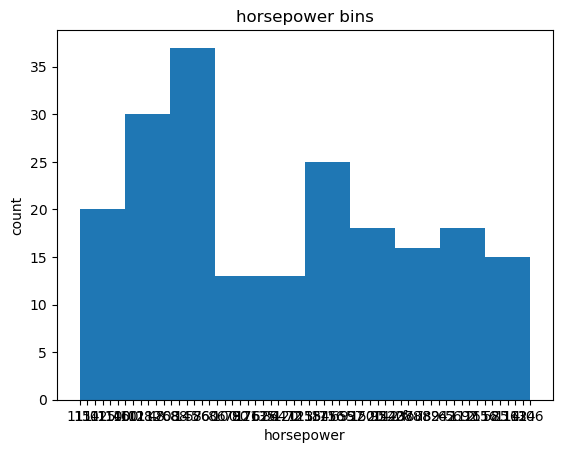

In [88]:
plt.pyplot.hist(df['horsepower'])
plt.pyplot.xlabel('horsepower')
plt.pyplot.ylabel('count')
plt.pyplot.title('horsepower bins')

In [89]:
df['horsepower'].value_counts()

68      19
70      11
69      10
116      9
110      8
95       7
88       6
62       6
101      6
160      6
114      6
84       5
97       5
102      5
145      5
82       5
76       5
111      4
92       4
123      4
86       4
90       3
73       3
85       3
207      3
182      3
121      3
152      3
112      2
56       2
161      2
156      2
94       2
52       2
four     2
162      2
155      2
184      2
100      2
176      2
55       1
262      1
134      1
115      1
140      1
48       1
58       1
60       1
78       1
135      1
200      1
64       1
120      1
72       1
154      1
288      1
143      1
142      1
175      1
106      1
Name: horsepower, dtype: int64

In [90]:
df['horsepower']=df['horsepower'].drop(index=[130,131])

In [91]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,13495,four,11.190476
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,16500,four,11.190476
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,...,six,152,mpfi,2.68,3.47,9.00,154,5000,19,9.038462,16500,four,12.368421
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,...,four,109,mpfi,3.19,3.40,10.00,102,5500,24,7.833333,13950,four,9.791667
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,...,five,136,mpfi,3.19,3.40,8.00,115,5500,18,10.681818,17450,four,13.055556
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,15250,four,12.368421
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,17710,four,12.368421
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,18920,four,12.368421
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,...,five,131,mpfi,3.13,3.40,8.30,140,5500,17,11.750000,23875,four,13.823529
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,...,five,131,mpfi,3.13,3.40,7.00,160,5500,16,10.681818,0,four,14.687500


In [92]:
df_horsepwr_mean=df['horsepower'].astype('float').mean()
print('mean horsepwr is ',df_horsepwr_mean)
df['horsepower']=df.replace(np.NaN,df_horsepwr_mean)
df

mean horsepwr is  104.25615763546799


ValueError: Columns must be same length as key

In [93]:
df1

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,115,5500,18,22,17450
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,110,5500,19,25,17710
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,140,5500,17,20,23875
10,2,192,bmw,gas,std,two,sedan,rwd,front,101.2,176.8,64.8,54.3,2395,ohc,four,108,mpfi,3.50,2.80,8.80,101,5800,23,29,16430
11,0,192,bmw,gas,std,four,sedan,rwd,front,101.2,176.8,64.8,54.3,2395,ohc,four,108,mpfi,3.50,2.80,8.80,101,5800,23,29,16925
12,0,188,bmw,gas,std,two,sedan,rwd,front,101.2,176.8,64.8,54.3,2710,ohc,six,164,mpfi,3.31,3.19,9.00,121,4250,21,28,20970
13,0,188,bmw,gas,std,four,sedan,rwd,front,101.2,176.8,64.8,54.3,2765,ohc,six,164,mpfi,3.31,3.19,9.00,121,4250,21,28,21105
18,2,121,chevrolet,gas,std,two,hatchback,fwd,front,88.4,141.1,60.3,53.2,1488,l,three,61,2bbl,2.91,3.03,9.50,48,5100,47,53,5151
19,1,98,chevrolet,gas,std,two,hatchback,fwd,front,94.5,155.9,63.6,52.0,1874,ohc,four,90,2bbl,3.03,3.11,9.60,70,5400,38,43,6295


In [94]:
df1_horsepwr_mean=df1['horsepower'].astype('float').mean()
print('mean horsepwr is ',df1_horsepwr_mean)
df1['horsepower']=df1.replace(np.NaN,df1_horsepwr_mean,inplace=True)
df1

mean horsepwr is  96.0


,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.00,None,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.00,None,5500,18,22,17450
6,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.50,None,5500,19,25,17710
8,1,158,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.30,None,5500,17,20,23875
10,2,192,bmw,gas,std,two,sedan,rwd,front,101.2,176.8,64.8,54.3,2395,ohc,four,108,mpfi,3.50,2.80,8.80,None,5800,23,29,16430
11,0,192,bmw,gas,std,four,sedan,rwd,front,101.2,176.8,64.8,54.3,2395,ohc,four,108,mpfi,3.50,2.80,8.80,None,5800,23,29,16925
12,0,188,bmw,gas,std,two,sedan,rwd,front,101.2,176.8,64.8,54.3,2710,ohc,six,164,mpfi,3.31,3.19,9.00,None,4250,21,28,20970
13,0,188,bmw,gas,std,four,sedan,rwd,front,101.2,176.8,64.8,54.3,2765,ohc,six,164,mpfi,3.31,3.19,9.00,None,4250,21,28,21105
18,2,121,chevrolet,gas,std,two,hatchback,fwd,front,88.4,141.1,60.3,53.2,1488,l,three,61,2bbl,2.91,3.03,9.50,None,5100,47,53,5151
19,1,98,chevrolet,gas,std,two,hatchback,fwd,front,94.5,155.9,63.6,52.0,1874,ohc,four,90,2bbl,3.03,3.11,9.60,None,5400,38,43,6295


In [95]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,13495,four,11.190476
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,16500,four,11.190476
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,...,six,152,mpfi,2.68,3.47,9.00,154,5000,19,9.038462,16500,four,12.368421
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,...,four,109,mpfi,3.19,3.40,10.00,102,5500,24,7.833333,13950,four,9.791667
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,...,five,136,mpfi,3.19,3.40,8.00,115,5500,18,10.681818,17450,four,13.055556
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,15250,four,12.368421
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,17710,four,12.368421
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,18920,four,12.368421
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,...,five,131,mpfi,3.13,3.40,8.30,140,5500,17,11.750000,23875,four,13.823529
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,...,five,131,mpfi,3.13,3.40,7.00,160,5500,16,10.681818,0,four,14.687500


In [96]:
df['normalized-losses'].value_counts()

four    41
161     11
91       8
150      7
134      6
128      6
104      6
85       5
94       5
65       5
102      5
74       5
168      5
103      5
95       5
106      4
93       4
118      4
148      4
122      4
83       3
125      3
154      3
115      3
137      3
101      3
119      2
87       2
89       2
192      2
197      2
158      2
81       2
188      2
194      2
153      2
129      2
108      2
110      2
164      2
145      2
113      2
256      1
107      1
90       1
231      1
142      1
121      1
78       1
98       1
186      1
77       1
Name: normalized-losses, dtype: int64

# ## Binning
<b>Why binning?</b>
<p>
    Binning is a process of transforming continuous numerical variables into discrete categorical 'bins' for grouped analysis.
</p>

<b>Example: </b>
<p>In your data set, "horsepower" is a real valued variable ranging from 48 to 288 and it has 59 unique values. What if you only care about the price difference between cars with high horsepower, medium horsepower, and little horsepower (3 types)? You can rearrange them into three ‘bins' to simplify analysis.</p>

<p>Use the Pandas method 'cut' to segment the 'horsepower' column into 3 bins.</p>


In [98]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,13495,four,11.190476
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,16500,four,11.190476
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,...,six,152,mpfi,2.68,3.47,9.00,154,5000,19,9.038462,16500,four,12.368421
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,...,four,109,mpfi,3.19,3.40,10.00,102,5500,24,7.833333,13950,four,9.791667
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,...,five,136,mpfi,3.19,3.40,8.00,115,5500,18,10.681818,17450,four,13.055556
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,15250,four,12.368421
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,17710,four,12.368421
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,18920,four,12.368421
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,...,five,131,mpfi,3.13,3.40,8.30,140,5500,17,11.750000,23875,four,13.823529
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,...,five,131,mpfi,3.13,3.40,7.00,160,5500,16,10.681818,0,four,14.687500


Text(0.5, 1.0, 'normalized-losses-bins')

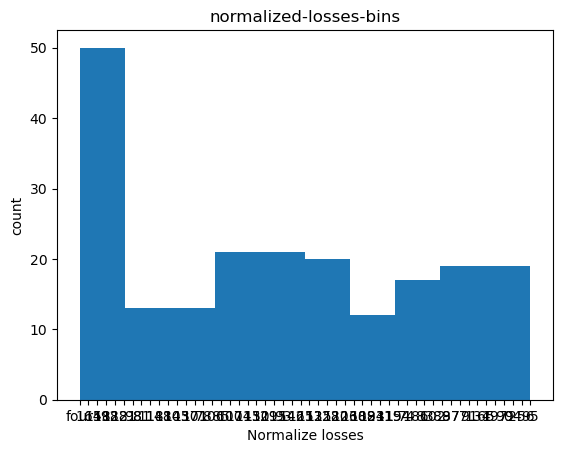

In [99]:
plt.pyplot.hist(df["normalized-losses"])
plt.pyplot.xlabel('Normalize losses')
plt.pyplot.ylabel('count')
plt.pyplot.title('normalized-losses-bins')

In [101]:
bin_name=['Low','Medium','High']

In [102]:
df["normalized-losses-bins"]=pd.cut(df["normalized-losses"],bins,labels=bin_name,include_lowest=True)

NameError: name 'bins' is not defined

In [103]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,13495,four,11.190476
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,16500,four,11.190476
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,...,six,152,mpfi,2.68,3.47,9.00,154,5000,19,9.038462,16500,four,12.368421
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,...,four,109,mpfi,3.19,3.40,10.00,102,5500,24,7.833333,13950,four,9.791667
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,...,five,136,mpfi,3.19,3.40,8.00,115,5500,18,10.681818,17450,four,13.055556
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,15250,four,12.368421
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,17710,four,12.368421
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,18920,four,12.368421
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,...,five,131,mpfi,3.13,3.40,8.30,140,5500,17,11.750000,23875,four,13.823529
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,...,five,131,mpfi,3.13,3.40,7.00,160,5500,16,10.681818,0,four,14.687500


# <h3>Bins Visualization</h3>
Normally, you use a histogram to visualize the distribution of bins we created above. 

Text(0.5, 1.0, 'normalized-losses-bins')

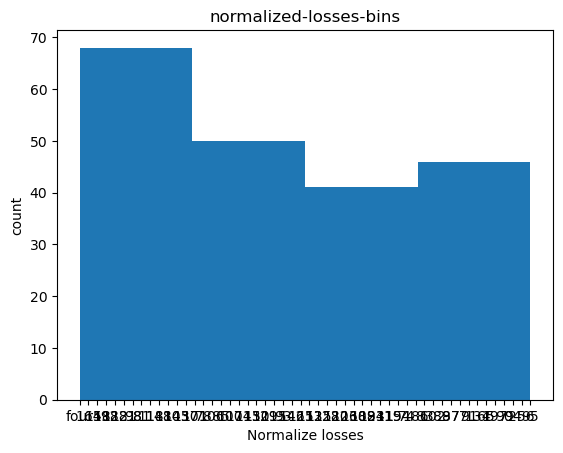

In [107]:
plt.pyplot.hist(df["normalized-losses"],bins=4)
plt.pyplot.xlabel('Normalize losses')
plt.pyplot.ylabel('count')
plt.pyplot.title('normalized-losses-bins')

# ## Indicator Variable
<b>What is an indicator variable?</b>
<p>
    An indicator variable (or dummy variable) is a numerical variable used to label categories. They are called 'dummies' because the numbers themselves don't have inherent meaning. 
</p>

<b>Why use indicator variables?</b>
<p>
    You use indicator variables so you can use categorical variables for regression analysis in the later modules.
</p>
<b>Example</b>
<p>
    The column "fuel-type" has two unique values: "gas" or "diesel". Regression doesn't understand words, only numbers. To use this attribute in regression analysis, you can convert "fuel-type" to indicator variables.
</p>

<p>
    Use the Panda method 'get_dummies' to assign numerical values to different categories of fuel type. 
</p>


In [108]:
df.columns

Index(['symboling', 'normalized-losses', 'make', 'fuel-type', 'aspiration',
       'num-of-doors', 'body-style', 'drive-wheels', 'engine-location',
       'wheel-base', 'length', 'width', 'height', 'curb-weight', 'engine-type',
       'num-of-cylinders', 'engine-size', 'fuel-system', 'bore', 'stroke',
       'compression-ratio', 'horsepower', 'peak-rpm', 'city-mpg',
       'highway-mpg', 'price', 'NOD1', 'city-L/100km'],
      dtype='object')

In [109]:
dummy_variable1=pd.get_dummies(df['fuel-type'])
dummy_variable1

,diesel,gas
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1
5,0,1
6,0,1
7,0,1
8,0,1
9,0,1


In [110]:
dummy_variable1.value_counts()

diesel  gas
0       1      185
1       0       20
dtype: int64

In [111]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,13495,four,11.190476
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,four,130,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,16500,four,11.190476
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,...,six,152,mpfi,2.68,3.47,9.00,154,5000,19,9.038462,16500,four,12.368421
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,...,four,109,mpfi,3.19,3.40,10.00,102,5500,24,7.833333,13950,four,9.791667
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,...,five,136,mpfi,3.19,3.40,8.00,115,5500,18,10.681818,17450,four,13.055556
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,15250,four,12.368421
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,17710,four,12.368421
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,...,five,136,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,18920,four,12.368421
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,...,five,131,mpfi,3.13,3.40,8.30,140,5500,17,11.750000,23875,four,13.823529
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,...,five,131,mpfi,3.13,3.40,7.00,160,5500,16,10.681818,0,four,14.687500


Change the column names for clarity:

In [112]:
dummy_variable1.rename(columns={'diesel':'fuel-type-diesel','gas':'fuel-type-gas'}, inplace=True)

In [113]:
dummy_variable1

,fuel-type-diesel,fuel-type-gas
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1
5,0,1
6,0,1
7,0,1
8,0,1
9,0,1


# concatinate  dummy_variable1 into df
In the data frame, column 'fuel-type' now has values for 'gas' and 'diesel' as 0s and 1s.

In [114]:
df=pd.concat( [df,dummy_variable1] ,axis=1)

In [115]:
df

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,...,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km,fuel-type-diesel,fuel-type-gas
0,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,13495,four,11.190476,0,1
1,3,four,alfa-romero,gas,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,...,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,16500,four,11.190476,0,1
2,1,four,alfa-romero,gas,std,None,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,...,mpfi,2.68,3.47,9.00,154,5000,19,9.038462,16500,four,12.368421,0,1
3,2,164,audi,gas,std,None,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,...,mpfi,3.19,3.40,10.00,102,5500,24,7.833333,13950,four,9.791667,0,1
4,2,164,audi,gas,std,None,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,...,mpfi,3.19,3.40,8.00,115,5500,18,10.681818,17450,four,13.055556,0,1
5,2,four,audi,gas,std,None,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,15250,four,12.368421,0,1
6,1,158,audi,gas,std,None,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,17710,four,12.368421,0,1
7,1,four,audi,gas,std,None,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,18920,four,12.368421,0,1
8,1,158,audi,gas,turbo,None,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,...,mpfi,3.13,3.40,8.30,140,5500,17,11.750000,23875,four,13.823529,0,1
9,0,four,audi,gas,turbo,None,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,...,mpfi,3.13,3.40,7.00,160,5500,16,10.681818,0,four,14.687500,0,1


In [116]:
df.drop('fuel-type',axis=1,inplace=True)

In [117]:
df

,symboling,normalized-losses,make,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,...,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km,fuel-type-diesel,fuel-type-gas
0,3,four,alfa-romero,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,...,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,13495,four,11.190476,0,1
1,3,four,alfa-romero,std,None,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,...,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,16500,four,11.190476,0,1
2,1,four,alfa-romero,std,None,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,2823,...,mpfi,2.68,3.47,9.00,154,5000,19,9.038462,16500,four,12.368421,0,1
3,2,164,audi,std,None,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,2337,...,mpfi,3.19,3.40,10.00,102,5500,24,7.833333,13950,four,9.791667,0,1
4,2,164,audi,std,None,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,2824,...,mpfi,3.19,3.40,8.00,115,5500,18,10.681818,17450,four,13.055556,0,1
5,2,four,audi,std,None,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,2507,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,15250,four,12.368421,0,1
6,1,158,audi,std,None,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,2844,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,17710,four,12.368421,0,1
7,1,four,audi,std,None,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,2954,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,18920,four,12.368421,0,1
8,1,158,audi,turbo,None,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,3086,...,mpfi,3.13,3.40,8.30,140,5500,17,11.750000,23875,four,13.823529,0,1
9,0,four,audi,turbo,None,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,3053,...,mpfi,3.13,3.40,7.00,160,5500,16,10.681818,0,four,14.687500,0,1


In [118]:
df2=df.copy()

In [119]:
 df2.drop('num-of-doors',axis=1,inplace=True)

In [120]:
df2

,symboling,normalized-losses,make,aspiration,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,...,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km,fuel-type-diesel,fuel-type-gas
0,3,four,alfa-romero,std,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,dohc,...,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,13495,four,11.190476,0,1
1,3,four,alfa-romero,std,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,dohc,...,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,16500,four,11.190476,0,1
2,1,four,alfa-romero,std,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,2823,ohcv,...,mpfi,2.68,3.47,9.00,154,5000,19,9.038462,16500,four,12.368421,0,1
3,2,164,audi,std,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,2337,ohc,...,mpfi,3.19,3.40,10.00,102,5500,24,7.833333,13950,four,9.791667,0,1
4,2,164,audi,std,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,2824,ohc,...,mpfi,3.19,3.40,8.00,115,5500,18,10.681818,17450,four,13.055556,0,1
5,2,four,audi,std,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,2507,ohc,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,15250,four,12.368421,0,1
6,1,158,audi,std,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,2844,ohc,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,17710,four,12.368421,0,1
7,1,four,audi,std,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,2954,ohc,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,18920,four,12.368421,0,1
8,1,158,audi,turbo,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,3086,ohc,...,mpfi,3.13,3.40,8.30,140,5500,17,11.750000,23875,four,13.823529,0,1
9,0,four,audi,turbo,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,3053,ohc,...,mpfi,3.13,3.40,7.00,160,5500,16,10.681818,0,four,14.687500,0,1


In [123]:
df2

,symboling,normalized-losses,make,aspiration,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,...,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km,fuel-type-diesel,fuel-type-gas
0,3,four,alfa-romero,std,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,dohc,...,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,13495,four,11.190476,0,1
1,3,four,alfa-romero,std,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,dohc,...,mpfi,3.47,2.68,9.00,111,5000,21,8.703704,16500,four,11.190476,0,1
2,1,four,alfa-romero,std,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,2823,ohcv,...,mpfi,2.68,3.47,9.00,154,5000,19,9.038462,16500,four,12.368421,0,1
3,2,164,audi,std,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,2337,ohc,...,mpfi,3.19,3.40,10.00,102,5500,24,7.833333,13950,four,9.791667,0,1
4,2,164,audi,std,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,2824,ohc,...,mpfi,3.19,3.40,8.00,115,5500,18,10.681818,17450,four,13.055556,0,1
5,2,four,audi,std,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,2507,ohc,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,15250,four,12.368421,0,1
6,1,158,audi,std,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,2844,ohc,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,17710,four,12.368421,0,1
7,1,four,audi,std,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,2954,ohc,...,mpfi,3.19,3.40,8.50,110,5500,19,9.400000,18920,four,12.368421,0,1
8,1,158,audi,turbo,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,3086,ohc,...,mpfi,3.13,3.40,8.30,140,5500,17,11.750000,23875,four,13.823529,0,1
9,0,four,audi,turbo,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,3053,ohc,...,mpfi,3.13,3.40,7.00,160,5500,16,10.681818,0,four,14.687500,0,1


In [124]:
df2.drop('horsepower',axis=1,inplace=True)

In [125]:
df2

,symboling,normalized-losses,make,aspiration,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,...,engine-size,fuel-system,bore,stroke,compression-ratio,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km,fuel-type-diesel,fuel-type-gas
0,3,four,alfa-romero,std,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,dohc,...,130,mpfi,3.47,2.68,9.00,5000,21,8.703704,13495,four,11.190476,0,1
1,3,four,alfa-romero,std,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,dohc,...,130,mpfi,3.47,2.68,9.00,5000,21,8.703704,16500,four,11.190476,0,1
2,1,four,alfa-romero,std,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,2823,ohcv,...,152,mpfi,2.68,3.47,9.00,5000,19,9.038462,16500,four,12.368421,0,1
3,2,164,audi,std,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,2337,ohc,...,109,mpfi,3.19,3.40,10.00,5500,24,7.833333,13950,four,9.791667,0,1
4,2,164,audi,std,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,2824,ohc,...,136,mpfi,3.19,3.40,8.00,5500,18,10.681818,17450,four,13.055556,0,1
5,2,four,audi,std,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,2507,ohc,...,136,mpfi,3.19,3.40,8.50,5500,19,9.400000,15250,four,12.368421,0,1
6,1,158,audi,std,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,2844,ohc,...,136,mpfi,3.19,3.40,8.50,5500,19,9.400000,17710,four,12.368421,0,1
7,1,four,audi,std,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,2954,ohc,...,136,mpfi,3.19,3.40,8.50,5500,19,9.400000,18920,four,12.368421,0,1
8,1,158,audi,turbo,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,3086,ohc,...,131,mpfi,3.13,3.40,8.30,5500,17,11.750000,23875,four,13.823529,0,1
9,0,four,audi,turbo,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,3053,ohc,...,131,mpfi,3.13,3.40,7.00,5500,16,10.681818,0,four,14.687500,0,1


# # Exploratory Data Analysis


Estimated time needed: **30** minutes
    

## Objectives

After completing this lab you will be able to:

* Explore features or characteristics to predict price of car
* Analyze patterns and run descriptive statistical analysis
* Group data based on identified parameters and create pivot tables
* Identify the effect of independent attributes on price of car

In [126]:
df2.corr()

C:\Users\Kapil\AppData\Local\Temp\ipykernel_29436\1778878097.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df2.corr()


,symboling,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,city-mpg,highway-mpg,price,city-L/100km,fuel-type-diesel,fuel-type-gas
symboling,1.000000,-0.531954,-0.357612,-0.232919,-0.541038,-0.227691,-0.105790,-0.178515,-0.035823,-0.030190,-0.071012,0.063165,-0.194311,0.194311
wheel-base,-0.531954,1.000000,0.874587,0.795144,0.589435,0.776386,0.569329,0.249786,-0.470414,0.578128,0.582015,0.474040,0.308346,-0.308346
length,-0.357612,0.874587,1.000000,0.841118,0.491029,0.877728,0.683360,0.158414,-0.670909,0.711597,0.690190,0.659165,0.212679,-0.212679
width,-0.232919,0.795144,0.841118,1.000000,0.279210,0.867032,0.735433,0.181129,-0.642704,0.728044,0.720020,0.682850,0.233880,-0.233880
height,-0.541038,0.589435,0.491029,0.279210,1.000000,0.295572,0.067149,0.261214,-0.048640,0.085892,0.150553,-0.002333,0.284631,-0.284631
curb-weight,-0.227691,0.776386,0.877728,0.867032,0.295572,1.000000,0.850594,0.151362,-0.757414,0.836742,0.815222,0.791911,0.217275,-0.217275
engine-size,-0.105790,0.569329,0.683360,0.735433,0.067149,0.850594,1.000000,0.028971,-0.653658,0.777077,0.855605,0.744952,0.069594,-0.069594
compression-ratio,-0.178515,0.249786,0.158414,0.181129,0.261214,0.151362,0.028971,1.000000,0.324701,-0.223411,0.078204,-0.296964,0.984356,-0.984356
city-mpg,-0.035823,-0.470414,-0.670909,-0.642704,-0.048640,-0.757414,-0.653658,0.324701,1.000000,-0.908439,-0.672586,-0.950493,0.255963,-0.255963
highway-mpg,-0.030190,0.578128,0.711597,0.728044,0.085892,0.836742,0.777077,-0.223411,-0.908439,1.000000,0.784194,0.955195,-0.153710,0.153710


In [127]:
df2[['bore', 'stroke', 'compression-ratio']].corr()

C:\Users\Kapil\AppData\Local\Temp\ipykernel_29436\2930285509.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df2[['bore', 'stroke', 'compression-ratio']].corr()


,compression-ratio
compression-ratio,1.0


In [128]:
df2.dtypes

symboling              int64
normalized-losses     object
make                  object
aspiration            object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                  object
stroke                object
compression-ratio    float64
peak-rpm              object
city-mpg               int64
highway-mpg          float64
price                  int32
NOD1                  object
city-L/100km         float64
fuel-type-diesel       uint8
fuel-type-gas          uint8
dtype: object

In [129]:
df2['bore'].value_counts()

3.62    23
3.19    20
3.15    15
3.03    12
2.97    12
3.46     9
3.31     8
3.78     8
3.43     8
3.27     7
2.91     7
3.39     6
3.54     6
3.05     6
3.58     6
3.70     5
3.01     5
3.35     4
four     4
3.17     3
3.59     3
3.74     3
3.47     2
3.94     2
3.24     2
3.13     2
3.63     2
3.50     2
3.80     2
3.33     2
2.54     1
3.08     1
3.61     1
3.34     1
3.60     1
2.92     1
3.76     1
2.68     1
2.99     1
Name: bore, dtype: int64

In [130]:
df2['bore'].replace('four',np.NaN)

0      3.47
1      3.47
2      2.68
3      3.19
4      3.19
5      3.19
6      3.19
7      3.19
8      3.13
9      3.13
10     3.50
11     3.50
12     3.31
13     3.31
14     3.31
15     3.62
16     3.62
17     3.62
18     2.91
19     3.03
20     3.03
21     2.97
22     2.97
23     3.03
24     2.97
25     2.97
26     2.97
27     3.03
28     3.34
29     3.60
30     2.91
31     2.91
32     2.91
33     2.91
34     2.91
35     2.91
36     2.92
37     3.15
38     3.15
39     3.15
40     3.15
41     3.15
42     3.15
43     3.31
44     3.03
45     3.03
46     3.43
47     3.63
48     3.63
49     3.54
50     3.03
51     3.03
52     3.03
53     3.03
54     3.08
55      NaN
56      NaN
57      NaN
58      NaN
59     3.39
60     3.39
61     3.39
62     3.39
63     3.39
64     3.39
65     3.76
66     3.43
67     3.58
68     3.58
69     3.58
70     3.58
71     3.46
72     3.46
73     3.80
74     3.80
75     3.78
76     2.97
77     2.97
78     2.97
79     3.03
80     3.17
81     3.35
82     3.58
83  

In [131]:
df2['bore'].dropna()

0      3.47
1      3.47
2      2.68
3      3.19
4      3.19
5      3.19
6      3.19
7      3.19
8      3.13
9      3.13
10     3.50
11     3.50
12     3.31
13     3.31
14     3.31
15     3.62
16     3.62
17     3.62
18     2.91
19     3.03
20     3.03
21     2.97
22     2.97
23     3.03
24     2.97
25     2.97
26     2.97
27     3.03
28     3.34
29     3.60
30     2.91
31     2.91
32     2.91
33     2.91
34     2.91
35     2.91
36     2.92
37     3.15
38     3.15
39     3.15
40     3.15
41     3.15
42     3.15
43     3.31
44     3.03
45     3.03
46     3.43
47     3.63
48     3.63
49     3.54
50     3.03
51     3.03
52     3.03
53     3.03
54     3.08
55     four
56     four
57     four
58     four
59     3.39
60     3.39
61     3.39
62     3.39
63     3.39
64     3.39
65     3.76
66     3.43
67     3.58
68     3.58
69     3.58
70     3.58
71     3.46
72     3.46
73     3.80
74     3.80
75     3.78
76     2.97
77     2.97
78     2.97
79     3.03
80     3.17
81     3.35
82     3.58
83  

In [132]:
df2['bore'].value_counts()

3.62    23
3.19    20
3.15    15
3.03    12
2.97    12
3.46     9
3.31     8
3.78     8
3.43     8
3.27     7
2.91     7
3.39     6
3.54     6
3.05     6
3.58     6
3.70     5
3.01     5
3.35     4
four     4
3.17     3
3.59     3
3.74     3
3.47     2
3.94     2
3.24     2
3.13     2
3.63     2
3.50     2
3.80     2
3.33     2
2.54     1
3.08     1
3.61     1
3.34     1
3.60     1
2.92     1
3.76     1
2.68     1
2.99     1
Name: bore, dtype: int64

In [133]:
df2

,symboling,normalized-losses,make,aspiration,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,...,engine-size,fuel-system,bore,stroke,compression-ratio,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km,fuel-type-diesel,fuel-type-gas
0,3,four,alfa-romero,std,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,dohc,...,130,mpfi,3.47,2.68,9.00,5000,21,8.703704,13495,four,11.190476,0,1
1,3,four,alfa-romero,std,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,dohc,...,130,mpfi,3.47,2.68,9.00,5000,21,8.703704,16500,four,11.190476,0,1
2,1,four,alfa-romero,std,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,2823,ohcv,...,152,mpfi,2.68,3.47,9.00,5000,19,9.038462,16500,four,12.368421,0,1
3,2,164,audi,std,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,2337,ohc,...,109,mpfi,3.19,3.40,10.00,5500,24,7.833333,13950,four,9.791667,0,1
4,2,164,audi,std,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,2824,ohc,...,136,mpfi,3.19,3.40,8.00,5500,18,10.681818,17450,four,13.055556,0,1
5,2,four,audi,std,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,2507,ohc,...,136,mpfi,3.19,3.40,8.50,5500,19,9.400000,15250,four,12.368421,0,1
6,1,158,audi,std,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,2844,ohc,...,136,mpfi,3.19,3.40,8.50,5500,19,9.400000,17710,four,12.368421,0,1
7,1,four,audi,std,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,2954,ohc,...,136,mpfi,3.19,3.40,8.50,5500,19,9.400000,18920,four,12.368421,0,1
8,1,158,audi,turbo,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,3086,ohc,...,131,mpfi,3.13,3.40,8.30,5500,17,11.750000,23875,four,13.823529,0,1
9,0,four,audi,turbo,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,3053,ohc,...,131,mpfi,3.13,3.40,7.00,5500,16,10.681818,0,four,14.687500,0,1


In [134]:
df2.drop([55,56,57,58],axis=0,inplace=True)

In [135]:
df2.reset_index()

,index,symboling,normalized-losses,make,aspiration,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,...,engine-size,fuel-system,bore,stroke,compression-ratio,peak-rpm,city-mpg,highway-mpg,price,NOD1,city-L/100km,fuel-type-diesel,fuel-type-gas
0,0,3,four,alfa-romero,std,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,...,130,mpfi,3.47,2.68,9.00,5000,21,8.703704,13495,four,11.190476,0,1
1,1,3,four,alfa-romero,std,convertible,rwd,front,88.6,0.811148,0.886584,0.816054,2548,...,130,mpfi,3.47,2.68,9.00,5000,21,8.703704,16500,four,11.190476,0,1
2,2,1,four,alfa-romero,std,hatchback,rwd,front,94.5,0.822681,0.905947,0.876254,2823,...,152,mpfi,2.68,3.47,9.00,5000,19,9.038462,16500,four,12.368421,0,1
3,3,2,164,audi,std,sedan,fwd,front,99.8,0.848630,0.915629,0.908027,2337,...,109,mpfi,3.19,3.40,10.00,5500,24,7.833333,13950,four,9.791667,0,1
4,4,2,164,audi,std,sedan,4wd,front,99.4,0.848630,0.918396,0.908027,2824,...,136,mpfi,3.19,3.40,8.00,5500,18,10.681818,17450,four,13.055556,0,1
5,5,2,four,audi,std,sedan,fwd,front,99.8,0.851994,0.917012,0.887960,2507,...,136,mpfi,3.19,3.40,8.50,5500,19,9.400000,15250,four,12.368421,0,1
6,6,1,158,audi,std,sedan,fwd,front,105.8,0.925997,0.987552,0.931438,2844,...,136,mpfi,3.19,3.40,8.50,5500,19,9.400000,17710,four,12.368421,0,1
7,7,1,four,audi,std,wagon,fwd,front,105.8,0.925997,0.987552,0.931438,2954,...,136,mpfi,3.19,3.40,8.50,5500,19,9.400000,18920,four,12.368421,0,1
8,8,1,158,audi,turbo,sedan,fwd,front,105.8,0.925997,0.987552,0.934783,3086,...,131,mpfi,3.13,3.40,8.30,5500,17,11.750000,23875,four,13.823529,0,1
9,9,0,four,audi,turbo,hatchback,4wd,front,99.5,0.856319,0.939142,0.869565,3053,...,131,mpfi,3.13,3.40,7.00,5500,16,10.681818,0,four,14.687500,0,1


In [136]:
df2['bore'].value_counts()

3.62    23
3.19    20
3.15    15
3.03    12
2.97    12
3.46     9
3.78     8
3.31     8
3.43     8
3.27     7
2.91     7
3.54     6
3.05     6
3.58     6
3.39     6
3.01     5
3.70     5
3.35     4
3.17     3
3.59     3
3.74     3
3.33     2
3.24     2
3.94     2
3.47     2
3.80     2
3.63     2
3.50     2
3.13     2
2.68     1
2.99     1
3.08     1
3.61     1
2.92     1
3.60     1
2.54     1
3.34     1
3.76     1
Name: bore, dtype: int64

In [137]:
df2['stroke'].value_counts()

3.40    20
3.03    14
3.23    14
3.15    14
3.39    13
2.64    11
3.29     9
3.35     9
3.46     8
3.07     6
3.58     6
3.50     6
3.27     6
3.41     6
3.11     6
3.19     6
3.52     5
3.64     5
3.47     4
3.86     4
3.54     4
3.90     3
2.90     3
3.08     2
2.19     2
2.68     2
3.10     2
4.17     2
2.80     2
3.12     1
3.21     1
2.07     1
2.36     1
3.16     1
2.76     1
2.87     1
Name: stroke, dtype: int64

In [138]:
df2[['bore', 'stroke', 'compression-ratio']].corr()

C:\Users\Kapil\AppData\Local\Temp\ipykernel_29436\2930285509.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df2[['bore', 'stroke', 'compression-ratio']].corr()


,compression-ratio
compression-ratio,1.0


In [139]:
df2.dtypes

symboling              int64
normalized-losses     object
make                  object
aspiration            object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                  object
stroke                object
compression-ratio    float64
peak-rpm              object
city-mpg               int64
highway-mpg          float64
price                  int32
NOD1                  object
city-L/100km         float64
fuel-type-diesel       uint8
fuel-type-gas          uint8
dtype: object

In [140]:
df2[['bore','stroke']].astype('float').corr()

,bore,stroke
bore,1.000000,-0.055909
stroke,-0.055909,1.000000


In [141]:
df2[['bore', 'stroke', 'compression-ratio']].astype('float').corr()

,bore,stroke,compression-ratio
bore,1.000000,-0.055909,0.005203
stroke,-0.055909,1.000000,0.186170
compression-ratio,0.005203,0.186170,1.000000


# <h2>Continuous Numerical Variables:</h2> 

<p>Continuous numerical variables are variables that may contain any value within some range. They can be of type "int64" or "float64". A great way to visualize these variables is by using scatterplots with fitted lines.</p>

<p>In order to start understanding the (linear) relationship between an individual variable and the price, we can use "regplot" which plots the scatterplot plus the fitted regression line for the data. This will be useful later on for visualizing the fit of the simple linear regression model as well. </p>


# <h3>Positive Linear Relationship</h4>

<Axes: xlabel='engine-size', ylabel='price'>

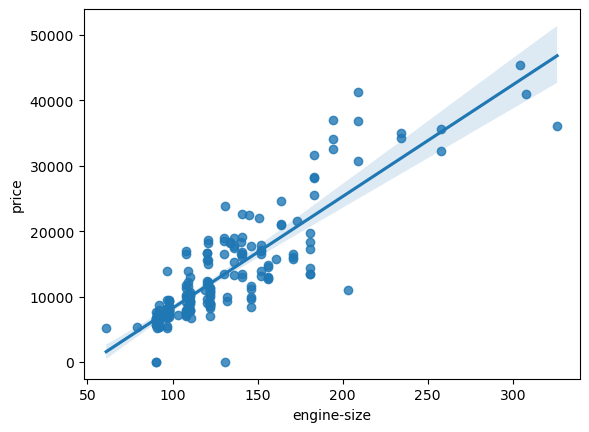

In [143]:
sns.regplot(x="engine-size", y="price", data=df2)

<p>As the engine-size goes up, the price goes up: this indicates a positive direct correlation between these two variables. Engine size seems like a pretty good predictor of price since the regression line is almost a perfect diagonal line.</p>

We can examine the correlation between 'engine-size' and 'price' and see that it's approximately 0.87.

In [144]:
df2[['engine-size','price']].corr()

,engine-size,price
engine-size,1.000000,0.870783
price,0.870783,1.000000


Highway mpg is a potential predictor variable of price. Let's find the scatterplot of "highway-mpg" and "price".

<Axes: xlabel='highway-mpg', ylabel='price'>

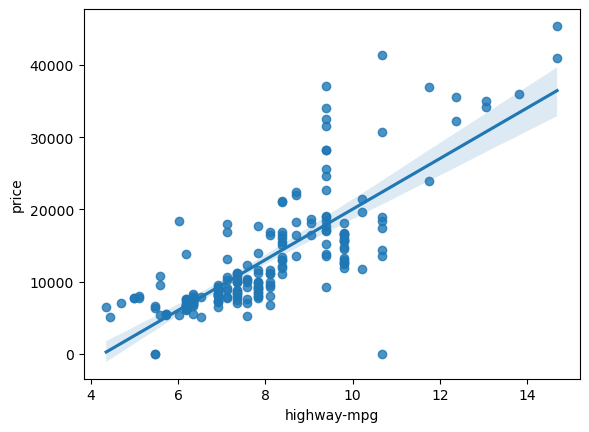

In [145]:
sns.regplot(x='highway-mpg',y='price',data=df2)

In [146]:
df2[['highway-mpg','price']].corr()

,highway-mpg,price
highway-mpg,1.000000,0.795691
price,0.795691,1.000000


# Weak Linear Relationship
Let's see if "peak-rpm" is a predictor variable of "price".

Peak rpm does not seem like a good predictor of the price at all since the regression line is close to horizontal. Also, the data points are very scattered and far from the fitted line, showing lots of variability. Therefore, it's not a reliable variable.

We can examine the correlation between 'peak-rpm' and 'price' and see it's approximately -0.101616.

In [147]:
df2['stroke'].value_counts()

3.40    20
3.03    14
3.23    14
3.15    14
3.39    13
2.64    11
3.29     9
3.35     9
3.46     8
3.07     6
3.58     6
3.50     6
3.27     6
3.41     6
3.11     6
3.19     6
3.52     5
3.64     5
3.47     4
3.86     4
3.54     4
3.90     3
2.90     3
3.08     2
2.19     2
2.68     2
3.10     2
4.17     2
2.80     2
3.12     1
3.21     1
2.07     1
2.36     1
3.16     1
2.76     1
2.87     1
Name: stroke, dtype: int64

In [149]:
df2.dtypes

symboling              int64
normalized-losses     object
make                  object
aspiration            object
body-style            object
drive-wheels          object
engine-location       object
wheel-base           float64
length               float64
width                float64
height               float64
curb-weight            int64
engine-type           object
num-of-cylinders      object
engine-size            int64
fuel-system           object
bore                  object
stroke                object
compression-ratio    float64
peak-rpm              object
city-mpg               int64
highway-mpg          float64
price                  int32
NOD1                  object
city-L/100km         float64
fuel-type-diesel       uint8
fuel-type-gas          uint8
dtype: object

In [150]:
df2['stroke'].astype('float')

0      2.68
1      2.68
2      3.47
3      3.40
4      3.40
5      3.40
6      3.40
7      3.40
8      3.40
9      3.40
10     2.80
11     2.80
12     3.19
13     3.19
14     3.19
15     3.39
16     3.39
17     3.39
18     3.03
19     3.11
20     3.11
21     3.23
22     3.23
23     3.39
24     3.23
25     3.23
26     3.23
27     3.39
28     3.46
29     3.90
30     3.41
31     3.41
32     3.07
33     3.41
34     3.41
35     3.41
36     3.41
37     3.58
38     3.58
39     3.58
40     3.58
41     3.58
42     3.58
43     3.23
44     3.11
45     3.11
46     3.23
47     4.17
48     4.17
49     2.76
50     3.15
51     3.15
52     3.15
53     3.15
54     3.15
59     3.39
60     3.39
61     3.39
62     3.39
63     3.39
64     3.39
65     3.16
66     3.64
67     3.64
68     3.64
69     3.64
70     3.64
71     3.10
72     3.10
73     3.35
74     3.35
75     3.12
76     3.23
77     3.23
78     3.23
79     3.39
80     3.46
81     3.46
82     3.86
83     3.86
84     3.86
85     3.46
86     3.46
87  

In [151]:
df2['price'].astype('float')

0      13495.0
1      16500.0
2      16500.0
3      13950.0
4      17450.0
5      15250.0
6      17710.0
7      18920.0
8      23875.0
9          0.0
10     16430.0
11     16925.0
12     20970.0
13     21105.0
14     24565.0
15     30760.0
16     41315.0
17     36880.0
18      5151.0
19      6295.0
20      6575.0
21      5572.0
22      6377.0
23      7957.0
24      6229.0
25      6692.0
26      7609.0
27      8558.0
28      8921.0
29     12964.0
30      6479.0
31      6855.0
32      5399.0
33      6529.0
34      7129.0
35      7295.0
36      7295.0
37      7895.0
38      9095.0
39      8845.0
40     10295.0
41     12945.0
42     10345.0
43      6785.0
44         0.0
45         0.0
46     11048.0
47     32250.0
48     35550.0
49     36000.0
50      5195.0
51      6095.0
52      6795.0
53      6695.0
54      7395.0
59      8845.0
60      8495.0
61     10595.0
62     10245.0
63     10795.0
64     11245.0
65     18280.0
66     18344.0
67     25552.0
68     28248.0
69     28176.0
70     316

In [152]:
df2[['stroke','price']].astype('float').corr()

,stroke,price
stroke,1.000000,0.084882
price,0.084882,1.000000


UFuncTypeError: ufunc 'multiply' did not contain a loop with signature matching types (dtype('<U4'), dtype('float64')) -> None

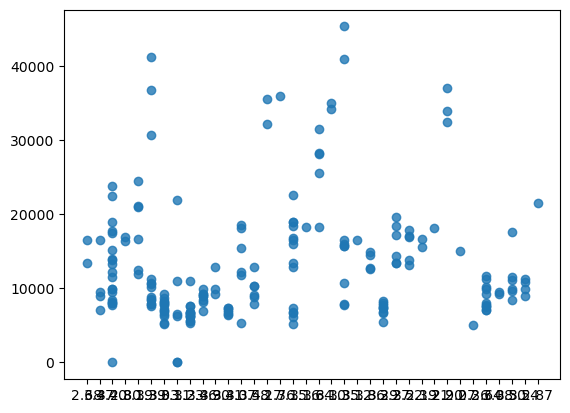

In [153]:
sns.regplot(x="stroke", y="price", data=df2)

#There is a weak correlation between the variable 'stroke' and 'price.' as such regression will not work well. We can see this using "regplot" to demonstrate this.


# <h3>Categorical Variables</h3>

<p>These are variables that describe a 'characteristic' of a data unit, and are selected from a small group of categories. The categorical variables can have the type "object" or "int64". A good way to visualize categorical variables is by using boxplots.</p>


<Axes: xlabel='body-style', ylabel='price'>

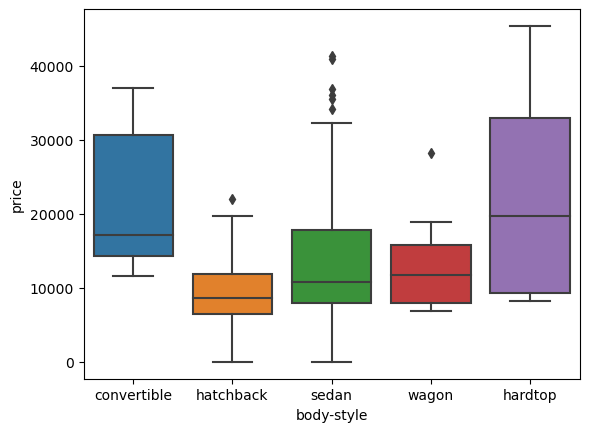

In [154]:
sns.boxplot(x="body-style", y="price", data=df)

We see that the distributions of price between the different body-style categories have a significant overlap, so body-style would not be a good predictor of price. Let's examine engine "engine-location" and "price":

<Axes: xlabel='engine-location', ylabel='price'>

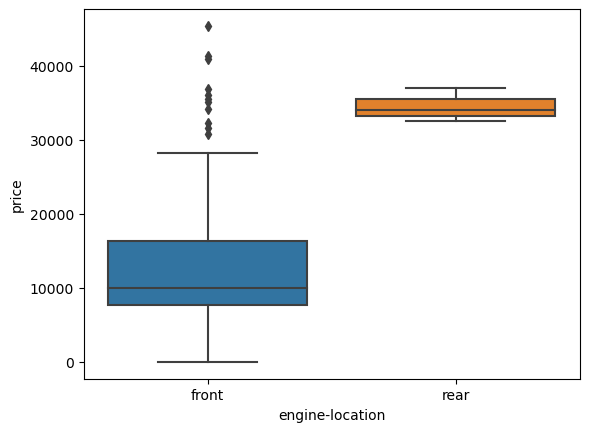

In [155]:
sns.boxplot(x="engine-location", y="price", data=df2)

Here we see that the distribution of price between these two engine-location categories, front and rear, are distinct enough to take engine-location as a potential good predictor of price.







Let's examine "drive-wheels" and "price".

<Axes: xlabel='drive-wheels', ylabel='price'>

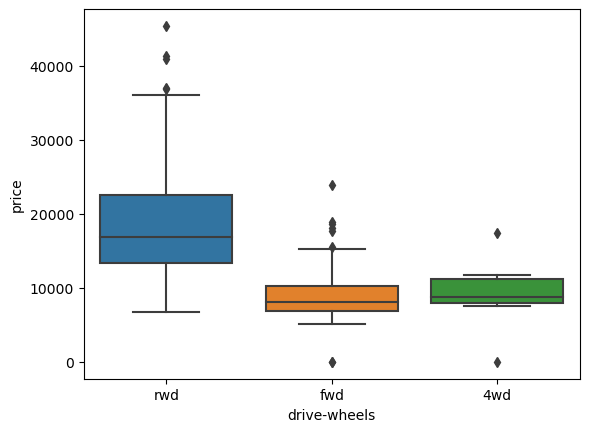

In [156]:
# drive-wheels
sns.boxplot(x="drive-wheels", y="price", data=df)

In [157]:
df.describe()

,symboling,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,city-mpg,highway-mpg,price,city-L/100km,fuel-type-diesel,fuel-type-gas
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.834146,98.756585,0.836373,0.911588,0.898409,2555.565854,126.907317,10.142537,25.219512,8.034347,13003.131707,9.949525,0.097561,0.902439
std,1.245307,6.021776,0.059285,0.029671,0.040862,520.680204,41.642693,3.972040,6.542142,1.849782,8028.978818,2.573104,0.297446,0.297446
min,-2.000000,86.600000,0.678039,0.834025,0.799331,1488.000000,61.000000,7.000000,13.000000,4.351852,0.000000,4.795918,0.000000,0.000000
25%,0.000000,94.500000,0.799135,0.886584,0.869565,2145.000000,97.000000,8.600000,19.000000,6.911765,7738.000000,7.833333,0.000000,1.000000
50%,1.000000,97.000000,0.832292,0.905947,0.904682,2414.000000,120.000000,9.000000,24.000000,7.833333,10245.000000,9.791667,0.000000,1.000000
75%,2.000000,102.400000,0.879865,0.925311,0.928094,2935.000000,141.000000,9.400000,30.000000,9.400000,16500.000000,12.368421,0.000000,1.000000
max,3.000000,120.900000,1.000000,1.000000,1.000000,4066.000000,326.000000,23.000000,49.000000,14.687500,45400.000000,18.076923,1.000000,1.000000


In [158]:
df.describe(include=['object'])

,normalized-losses,make,aspiration,num-of-doors,body-style,drive-wheels,engine-location,engine-type,num-of-cylinders,fuel-system,bore,stroke,horsepower,peak-rpm,NOD1
count,205,205,205,0,205,205,205,205,205,205,205,205,203,205,205
unique,52,22,2,0,5,3,2,7,7,8,39,37,59,24,2
top,four,toyota,std,NaN,sedan,fwd,front,ohc,four,mpfi,3.62,3.40,68,5500,four
freq,41,32,168,NaN,96,120,202,148,159,94,23,20,19,37,141


# Value Counts
Value counts is a good way of understanding how many units of each characteristic/variable we have. We can apply the "value_counts" method on the column "drive-wheels". Don’t forget the method "value_counts" only works on pandas series, not pandas dataframes. As a result, we only include one bracket df['drive-wheels'], not two brackets df[['drive-wheels']].

In [159]:
df['drive-wheels'].value_counts()

fwd    120
rwd     76
4wd      9
Name: drive-wheels, dtype: int64

# We can convert the series to a dataframe as follows:

In [160]:
df['drive-wheels'].value_counts().to_frame()

,drive-wheels
fwd,120
rwd,76
4wd,9


In [161]:
drive_wheels_counts = df['drive-wheels'].value_counts().to_frame()
drive_wheels_counts.rename(columns={'drive-wheels': 'value_counts'}, inplace=True)
drive_wheels_counts

,value_counts
fwd,120
rwd,76
4wd,9


# Now let's rename the index to 'drive-wheels':

In [162]:
drive_wheels_counts.index.name='drive-wheels'

In [163]:
drive_wheels_counts

,value_counts
drive-wheels,
fwd,120
rwd,76
4wd,9


In [164]:
# engine-location as variable
engine_loc_counts = df['engine-location'].value_counts().to_frame()
engine_loc_counts.rename(columns={'engine-location': 'value_counts'}, inplace=True)
engine_loc_counts.index.name = 'engine-location'
engine_loc_counts.head(10)

,value_counts
engine-location,
front,202
rear,3


# Basics of Grouping
The "groupby" method groups data by different categories. The data is grouped based on one or several variables, and analysis is performed on the individual groups.

For example, let's group by the variable "drive-wheels". We see that there are 3 different categories of drive wheels.

In [165]:
df2['drive-wheels'].unique()

array(['rwd', 'fwd', '4wd'], dtype=object)

In [166]:
df2_group_one=df2[['drive-wheels','body-style','price']]

In [167]:
df2_group_one

,drive-wheels,body-style,price
0,rwd,convertible,13495
1,rwd,convertible,16500
2,rwd,hatchback,16500
3,fwd,sedan,13950
4,4wd,sedan,17450
5,fwd,sedan,15250
6,fwd,sedan,17710
7,fwd,wagon,18920
8,fwd,sedan,23875
9,4wd,hatchback,0


In [168]:
df2[['drive-wheels','body-style','price']]

,drive-wheels,body-style,price
0,rwd,convertible,13495
1,rwd,convertible,16500
2,rwd,hatchback,16500
3,fwd,sedan,13950
4,4wd,sedan,17450
5,fwd,sedan,15250
6,fwd,sedan,17710
7,fwd,wagon,18920
8,fwd,sedan,23875
9,4wd,hatchback,0


### We can then calculate the average price for each of the different categories of data.

In [169]:
df2_group_one=df2_group_one.groupby(['drive-wheels']).mean()

C:\Users\Kapil\AppData\Local\Temp\ipykernel_29436\2554807700.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df2_group_one=df2_group_one.groupby(['drive-wheels']).mean()


In [170]:
df2_group_one

,price
drive-wheels,
4wd,9103.111111
fwd,9090.700000
rwd,20010.416667


From our data, it seems rear-wheel drive vehicles are, on average, the most expensive, while 4-wheel and front-wheel are approximately the same in price.

You can also group by multiple variables. For example, let's group by both 'drive-wheels' and 'body-style'. This groups the dataframe by the unique combination of 'drive-wheels' and 'body-style'. We can store the results in the variable 'grouped_test1'.

In [171]:
# grouping results
df2_gptest = df2[['drive-wheels','body-style','price']]
grouped_test1 = df2_gptest.groupby(['drive-wheels','body-style'],as_index=False).mean()
grouped_test1

,drive-wheels,body-style,price
0,4wd,hatchback,3801.500000
1,4wd,sedan,12647.333333
2,4wd,wagon,9095.750000
3,fwd,convertible,11595.000000
4,fwd,hardtop,8249.000000
5,fwd,hatchback,8396.387755
6,fwd,sedan,9467.526316
7,fwd,wagon,9997.333333
8,rwd,convertible,23949.600000
9,rwd,hardtop,24202.714286


This grouped data is much easier to visualize when it is made into a pivot table. A pivot table is like an Excel spreadsheet, with one variable along the column and another along the row. We can convert the dataframe to a pivot table using the method "pivot" to create a pivot table from the groups.

In this case, we will leave the drive-wheels variable as the rows of the table, and pivot body-style to become the columns of the table:

In [172]:
grouped_pivot = grouped_test1.pivot(index='drive-wheels',columns='body-style')
grouped_pivot

price                                            \
body-style   convertible       hardtop     hatchback         sedan   
drive-wheels                                                         
4wd                  NaN           NaN   3801.500000  12647.333333   
fwd              11595.0   8249.000000   8396.387755   9467.526316   
rwd              23949.6  24202.714286  14467.266667  21711.833333   

                            
body-style           wagon  
drive-wheels                
4wd            9095.750000  
fwd            9997.333333  
rwd           16994.222222

Often, we won't have data for some of the pivot cells. We can fill these missing cells with the value 0, but any other value could potentially be used as well. It should be mentioned that missing data is quite a complex subject and is an entire course on its own.

In [173]:
grouped_pivot = grouped_pivot.fillna(0) #fill missing values with 0
grouped_pivot

price                                            \
body-style   convertible       hardtop     hatchback         sedan   
drive-wheels                                                         
4wd                  0.0      0.000000   3801.500000  12647.333333   
fwd              11595.0   8249.000000   8396.387755   9467.526316   
rwd              23949.6  24202.714286  14467.266667  21711.833333   

                            
body-style           wagon  
drive-wheels                
4wd            9095.750000  
fwd            9997.333333  
rwd           16994.222222

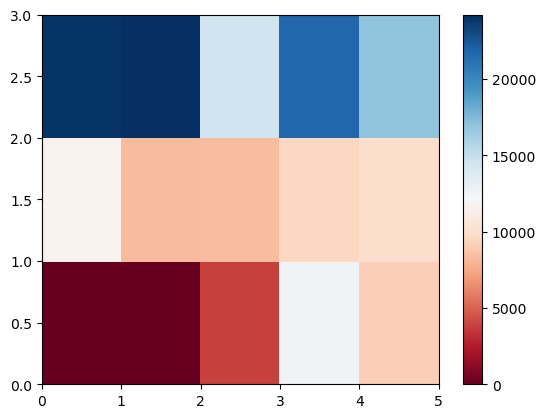

In [174]:
#use the grouped results
plt.pyplot.pcolor(grouped_pivot, cmap='RdBu')
plt.pyplot.colorbar()
plt.pyplot.show()

Visualization is very important in data science, and Python visualization packages provide great freedom.

The main question we want to answer in this module is, "What are the main characteristics which have the most impact on the car price?".

To get a better measure of the important characteristics, we look at the correlation of these variables with the car price. In other words: how is the car price dependent on this variable?

# Correlation and Causation
Correlation: a measure of the extent of interdependence between variables.

Causation: the relationship between cause and effect between two variables.

It is important to know the difference between these two. Correlation does not imply causation. Determining correlation is much simpler the determining causation as causation may require independent experimentation.

Pearson Correlation

The Pearson Correlation measures the linear dependence between two variables X and Y.

The resulting coefficient is a value between -1 and 1 inclusive, where:

1: Perfect positive linear correlation.

0: No linear correlation, the two variables most likely do not affect each other.
-1: Perfect negative linear correlation.

Pearson Correlation is the default method of the function "corr". Like before, we can calculate the Pearson Correlation of the of the 'int64' or 'float64' variables.

In [175]:
df2.corr()

C:\Users\Kapil\AppData\Local\Temp\ipykernel_29436\1778878097.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df2.corr()


,symboling,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,city-mpg,highway-mpg,price,city-L/100km,fuel-type-diesel,fuel-type-gas
symboling,1.000000,-0.529963,-0.354854,-0.236847,-0.512425,-0.225155,-0.063358,-0.177526,0.009660,-0.074540,-0.073374,0.008345,-0.188903,0.188903
wheel-base,-0.529963,1.000000,0.874235,0.796735,0.588972,0.776435,0.565971,0.248547,-0.495274,0.602079,0.584254,0.506999,0.305918,-0.305918
length,-0.354854,0.874235,1.000000,0.841815,0.492246,0.877688,0.685675,0.157202,-0.694416,0.732744,0.691707,0.691137,0.210574,-0.210574
width,-0.236847,0.796735,0.841815,1.000000,0.284182,0.867326,0.745893,0.180847,-0.656395,0.740788,0.720447,0.704163,0.233518,-0.233518
height,-0.512425,0.588972,0.492246,0.284182,1.000000,0.294991,0.024147,0.262584,-0.096732,0.131317,0.155185,0.054255,0.282006,-0.282006
curb-weight,-0.225155,0.776435,0.877688,0.867326,0.294991,1.000000,0.858758,0.150508,-0.778311,0.856018,0.815967,0.822353,0.215876,-0.215876
engine-size,-0.063358,0.565971,0.685675,0.745893,0.024147,0.858758,1.000000,0.024520,-0.711523,0.833851,0.870783,0.821238,0.062167,-0.062167
compression-ratio,-0.177526,0.248547,0.157202,0.180847,0.262584,0.150508,0.024520,1.000000,0.325489,-0.222192,0.078278,-0.298834,0.984533,-0.984533
city-mpg,0.009660,-0.495274,-0.694416,-0.656395,-0.096732,-0.778311,-0.711523,0.325489,1.000000,-0.905720,-0.684213,-0.949319,0.252008,-0.252008
highway-mpg,-0.074540,0.602079,0.732744,0.740788,0.131317,0.856018,0.833851,-0.222192,-0.905720,1.000000,0.795691,0.955386,-0.148205,0.148205


# P-value

What is this P-value? The P-value is the probability value that the correlation between these two variables is statistically significant. Normally, we choose a significance level of 0.05, which means that we are 95% confident that the correlation between the variables is significant.

By convention, when the

p-value is <
 0.001: we say there is strong evidence that the correlation is significant.
 
the p-value is 
 <0.05: there is moderate evidence that the correlation is significant.
 
the p-value is 
<0.1: there is weak evidence that the correlation is significant.

the p-value is  >0.1: there is no evidence that the correlation is significant.

# We can obtain this information using "stats" module in the "scipy" library.

from scipy import stats

# Wheel-Base vs. Price
Let's calculate the Pearson Correlation Coefficient and P-value of 'wheel-base' and 'price'.

In [176]:
pearson_coef,p_value=stats.pearsonr(df2['wheel-base'],df2['price'])
print('the pearson coef is',pearson_coef,'p value is ',p_value)

the pearson coef is 0.584254453077506 p value is  8.654050382316646e-20


Conclusion:
Since the p-value is 
 0.001, the correlation between wheel-base and price is statistically significant, although the linear relationship isn't extremely strong (~0.585).

# Length vs. Price
Let's calculate the Pearson Correlation Coefficient and P-value of 'length' and 'price'.



In [177]:
pearson_coef,p_value=stats.pearsonr(df2['length'],df2['price'])
print('the pearson coef is ',pearson_coef,'p value is ',p_value)

the pearson coef is  0.6917067754594592 p value is  6.0253708794037376e-30


# Width vs. Price
Let's calculate the Pearson Correlation Coefficient and P-value of 'width' and 'price'

In [178]:
pearson_coef,p_value=stats.pearsonr(df2['width'],df2['price'])
print('the pearson coef is ',pearson_coef,'p value is ',p_value)

the pearson coef is  0.7204472503845749 p value is  1.827453547673362e-33


Conclusion:
Since the p-value is < 0.001, the correlation between width and price is statistically significant, and the linear relationship is quite strong (~0.751).

# Curb-Weight vs. Price






Let's calculate the Pearson Correlation Coefficient and P-value of 'curb-weight' and 'price':

In [179]:
pearson_coef,p_value=stats.pearsonr(df2['curb-weight'],df2['price'])
print('the pearson coef is ',pearson_coef,'p value is ',p_value)

the pearson coef is  0.815966895746859 p value is  3.003332577821753e-49


Conclusion:
Since the p-value is 
 0.001, the correlation between curb-weight and price is statistically significant, and the linear relationship is quite strong (~0.834)

# Engine-Size vs. Price
Let's calculate the Pearson Correlation Coefficient and P-value of 'engine-size' and 'price':

In [180]:
pearson_coef,p_value=stats.pearsonr(df2['engine-size'],df2['price'])
print('the pearson coef is ',pearson_coef,'p value is ',p_value)

the pearson coef is  0.8707829851830514 p value is  2.8445383385794094e-63


# City-mpg vs. Price

In [181]:
pearson_coef,p_value=stats.pearsonr(df2['city-mpg'],df2['price'])
print('the pearson coef is ',pearson_coef,'p value is ',p_value)

the pearson coef is  -0.6842125437796733 p value is  4.2720559919362413e-29


Since the p-value is 
 0.001, the correlation between city-mpg and price is statistically significant, and the coefficient of about -0.687 shows that the relationship is negative and moderately strong.

# Highway-mpg vs. Price

In [182]:
pearson_coed,p_value=stats.pearsonr(df2['highway-mpg'],df2['price'])
print('the pearson coef is ',pearson_coef,'p value is ',p_value)

the pearson coef is  -0.6842125437796733 p value is  3.3086003161351264e-45


Conclusion:
Since the p-value is < 0.001, the correlation between highway-mpg and price is statistically significant, and the coefficient of about -0.705 shows that the relationship is negative and moderately strong.

# Model Development

Develop prediction models
In this section, we will develop several models that will predict the price of the car using the variables or features. This is just an estimate but should give us an objective idea of how much the car should cost.

Some questions we want to ask in this module

Do I know if the dealer is offering fair value for my trade-in?
Do I know if I put a fair value on my car?
In data analytics, we often use Model Development to help us predict future observations from the data we have.

A model will help us understand the exact relationship between different variables and how these variables are used to predict the result.

# 1. Linear Regression and Multiple Linear Regression
Linear Regression
One example of a Data Model that we will be using is:

Simple Linear Regression
Simple Linear Regression is a method to help us understand the relationship between two variables:

The predictor/independent variable (X)
The response/dependent variable (that we want to predict)(Y)
The result of Linear Regression is a linear function that predicts the response (dependent) variable as a function of the predictor (independent) variable.



# $$
 Y: Response \ Variable\\\\
 X: Predictor \ Variables
$$


a refers to the intercept of the regression line, in other words: the value of Y when X is 0

b refers to the slope of the regression line, in other words: the value with which Y changes when X increases by 1 unit

# Let's load the modules for linear regression:

In [183]:
from sklearn.linear_model import LinearRegression

# Create the linear regression object:

In [184]:
lm=LinearRegression()
lm

LinearRegression()

# How could "highway-mpg" help us predict car price?
For this example, we want to look at how highway-mpg can help us predict car price. Using simple linear regression, we will create a linear function with "highway-mpg" as the predictor variable and the "price" as the response variable.

# Fit the linear model using highway-mpg:

In [185]:
X= np.array(df2['highway-mpg'])
X_reshape=X.reshape(-1,1)
Y=df2['price']

In [186]:
lm.fit(X_reshape,Y)

LinearRegression()

In [187]:
Yhat=lm.predict(X_reshaped) 
Yhat[0:5]

NameError: name 'X_reshaped' is not defined

# What is the value of the intercept (a)?

In [188]:
lm.intercept_

-14974.113417532573

# What is the value of the slope (b)?

In [189]:
lm.coef_

array([3501.09450999])

# What is the final estimated linear model we get?
As we saw above, we should get a final linear model with the structure:

$$
Yhat = a + b  X
$$

Plugging in the actual values we get:

Price = -14974.113417532573 - 3501.09450999 x highway-mpg



In [190]:
lm1=LinearRegression()

# Train the model using "engine-size" as the independent variable and "price" as the dependent variable?

In [191]:
X1=np.array(df2['engine-size'])
X1_reshaped=X1.reshape(-1,1)
Y1_reshaped=df2['price']
lm1.fit(X1_reshaped,Y1_reshaped)

LinearRegression()

In [192]:
Y1hat = lm1.predict(X1_reshaped)
Y1hat[0:5]

array([13346.03166907, 13346.03166907, 17102.93275976,  9759.89880978,
       14370.64105744])

In [193]:
lm1.intercept_

-8853.838412288487

In [194]:
lm1.coef_

array([170.7682314])

In [195]:
predict=-8853.838412288487-170.7682314*X1_reshaped
predict=-8853.838412288487-170.7682314*df2['engine-size']
predict

0     -31053.708494
1     -31053.708494
2     -34810.609585
3     -27467.575635
4     -32078.317883
5     -32078.317883
6     -32078.317883
7     -32078.317883
8     -31224.476726
9     -31224.476726
10    -27296.807403
11    -27296.807403
12    -36859.828362
13    -36859.828362
14    -36859.828362
15    -44544.398775
16    -44544.398775
17    -44544.398775
18    -19270.700528
19    -24222.979238
20    -24222.979238
21    -24222.979238
22    -24222.979238
23    -25589.125089
24    -24222.979238
25    -24222.979238
26    -24222.979238
27    -25589.125089
28    -29687.562643
29    -35493.682511
30    -24564.515701
31    -24564.515701
32    -22344.528693
33    -24564.515701
34    -24564.515701
35    -24564.515701
36    -24564.515701
37    -27638.343866
38    -27638.343866
39    -27638.343866
40    -27638.343866
41    -27638.343866
42    -27638.343866
43    -27809.112098
44    -24222.979238
45    -24222.979238
46    -29175.257949
47    -52912.042113
48    -52912.042113
49    -64524.281849


# Multiple Linear Regression
What if we want to predict car price using more than one variable?

If we want to use more variables in our model to predict car price, we can use Multiple Linear Regression. Multiple Linear Regression is very similar to Simple Linear Regression, but this method is used to explain the relationship between one continuous response (dependent) variable and two or more predictor (independent) variables. Most of the real-world regression models involve multiple predictors. We will illustrate the structure by using four predictor variables, but these results can generalize to any integer:

$$
Y: Response \ Variable\\\\
X_1 :Predictor\ Variable \ 1\\
X_2: Predictor\ Variable \ 2\\
X_3: Predictor\ Variable \ 3\\
X_4: Predictor\ Variable \ 4\\
$$



$$
a: intercept\\\\
b_1 :coefficients \ of\ Variable \ 1\\
b_2: coefficients \ of\ Variable \ 2\\
b_3: coefficients \ of\ Variable \ 3\\
b_4: coefficients \ of\ Variable \ 4\\
$$


# The equation is given by:
$$
Yhat = a + b_1 X_1 + b_2 X_2 + b_3 X_3 + b_4 X_4
$$


From the previous section we know that other good predictors of price could be:

1. Horsepower
2. Curb-weight
3. Engine-size
4. Highway-mpg

Let's develop a model using these variables as the predictor variables.

In [196]:
X = np.array(df2[['wheel-base', 'curb-weight', 'engine-size', 'highway-mpg']])
X_reshape=Z.reshape(-1,1)

NameError: name 'Z' is not defined

In [197]:

Y=np.array(df2['price'])
Y_reshape=Y.reshape(-1,1)

In [198]:
lm2=LinearRegression()
lm2.fit(X_reshape,Y_reshape)


LinearRegression()

In [199]:
Y2hat=lm2.predict(Y_reshape)

In [200]:
Y2hat

array([[ 4.72322963e+07],
       [ 5.77530853e+07],
       [ 5.77530853e+07],
       [ 4.88252943e+07],
       [ 6.10791251e+07],
       [ 5.33767172e+07],
       [ 6.19894097e+07],
       [ 6.62257340e+07],
       [ 8.35736573e+07],
       [-1.49741134e+04],
       [ 5.75080087e+07],
       [ 5.92410505e+07],
       [ 7.34029778e+07],
       [ 7.38756255e+07],
       [ 8.59894125e+07],
       [ 1.07678693e+08],
       [ 1.44632746e+08],
       [ 1.29105391e+08],
       [ 1.80191637e+07],
       [ 2.20244158e+07],
       [ 2.30047223e+07],
       [ 1.94931245e+07],
       [ 2.23115056e+07],
       [ 2.78432349e+07],
       [ 2.17933436e+07],
       [ 2.34143503e+07],
       [ 2.66248540e+07],
       [ 2.99473927e+07],
       [ 3.12182900e+07],
       [ 4.53732151e+07],
       [ 2.26686172e+07],
       [ 2.39850288e+07],
       [ 1.88874351e+07],
       [ 2.28436719e+07],
       [ 2.49443286e+07],
       [ 2.55255103e+07],
       [ 2.55255103e+07],
       [ 2.76261670e+07],
       [ 3.1

In [201]:
lm2.intercept_

array([-14974.11341753])

In [202]:
lm2.

SyntaxError: invalid syntax (4122680888.py, line 1)

As we saw above, we should get a final linear function with the structure:

$$
Yhat = a + b_1 X_1 + b_2 X_2 + b_3 X_3 + b_4 X_4
$$

What is the linear function we get in this example?

# 2. Model Evaluation Using Visualization
Now that we've developed some models, how do we evaluate our models and choose the best one? One way to do this is by using a visualization.

Import the visualization package, seaborn:

Regression Plot
When it comes to simple linear regression, an excellent way to visualize the fit of our model is by using regression plots.

This plot will show a combination of a scattered data points (a scatterplot), as well as the fitted linear regression line going through the data. This will give us a reasonable estimate of the relationship between the two variables, the strength of the correlation, as well as the direction (positive or negative correlation).

Let's visualize highway-mpg as potential predictor variable of price

(0.0, 47722.24859240716)

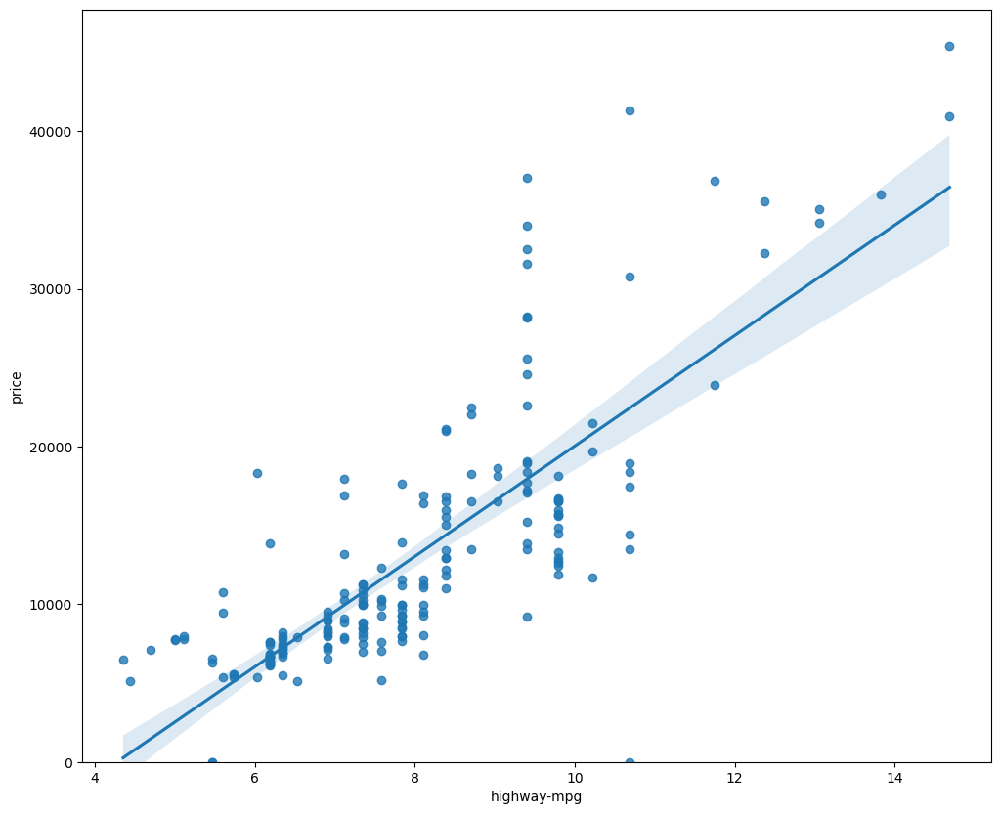

In [203]:
width=12
height=10
plt.pyplot.figure(figsize=(width,height))
sns.regplot(x='highway-mpg',y='price',data=df2)
plt.pyplot.ylim(0,)

We can see from this plot that price is positively correlated to highway-mpg since the regression slope is negative.

One thing to keep in mind when looking at a regression plot is to pay attention to how scattered the data points are around the regression line. This will give you a good indication of the variance of the data and whether a linear model would be the best fit or not. If the data is too far off from the line, this linear model might not be the best model for this data.

Let's compare this plot to the regression plot of "peak-rpm".

UFuncTypeError: ufunc 'multiply' did not contain a loop with signature matching types (dtype('<U4'), dtype('float64')) -> None

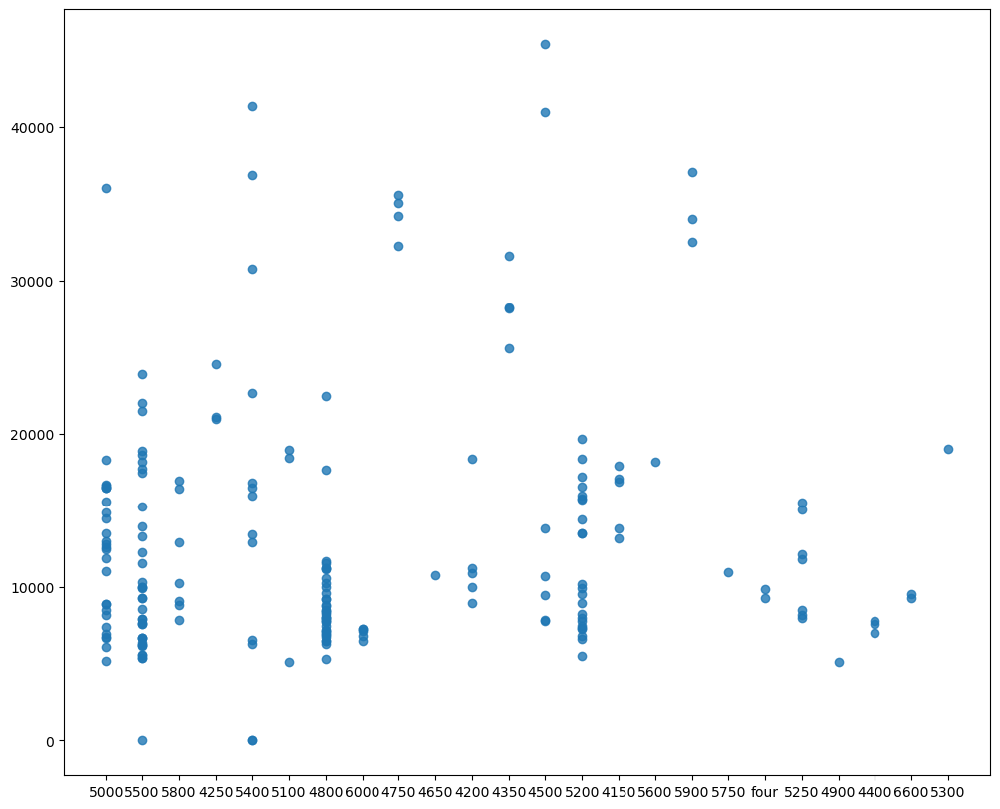

In [204]:
plt.pyplot.figure(figsize=(width,height))
sns.regplot(x="peak-rpm", y="price", data=df2)
plt.pyplot.ylim(0,)

Comparing the regression plot of "peak-rpm" and "highway-mpg", we see that the points for "highway-mpg" are much closer to the generated line and, on average, decrease. The points for "peak-rpm" have more spread around the predicted line and it is much harder to determine if the points are decreasing or increasing as the "peak-rpm" increases.

# Residual Plot
A good way to visualize the variance of the data is to use a residual plot.

What is a residual?

The difference between the observed value (y) and the predicted value (Yhat) is called the residual (e). When we look at a regression plot, the residual is the distance from the data point to the fitted regression line.

So what is a residual plot?

A residual plot is a graph that shows the residuals on the vertical y-axis and the independent variable on the horizontal x-axis.

What do we pay attention to when looking at a residual plot?

We look at the spread of the residuals:

- If the points in a residual plot are randomly spread out around the x-axis, then a linear model is appropriate for the data.

Why is that? Randomly spread out residuals means that the variance is constant, and thus the linear model is a good fit for this data.



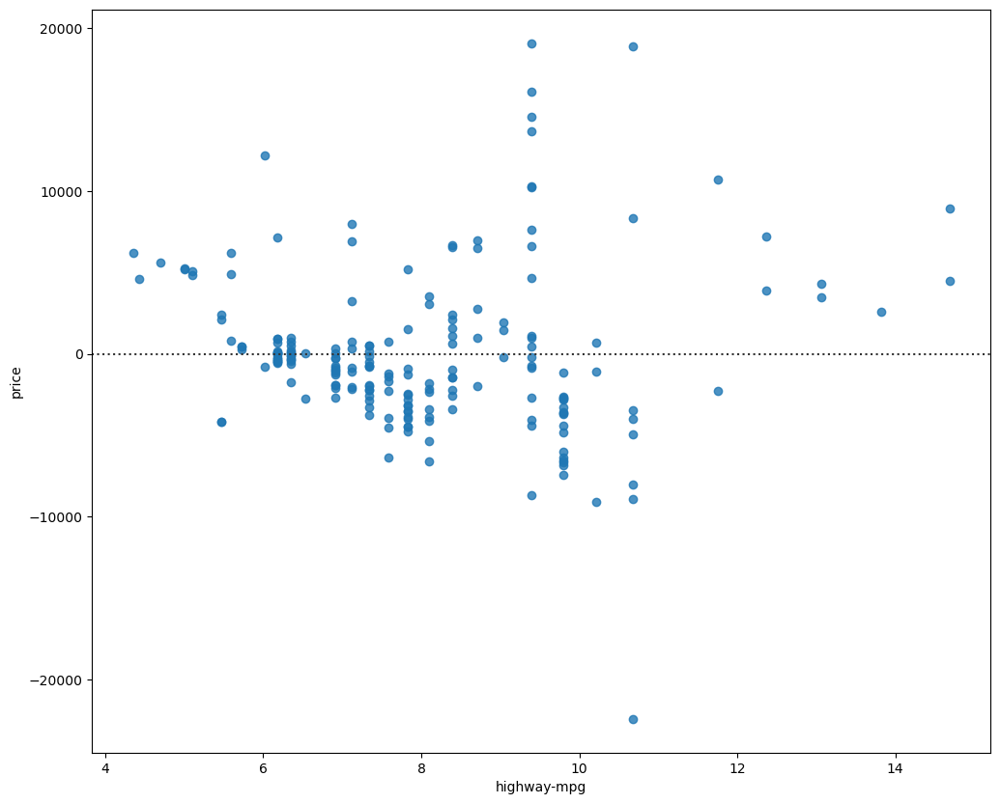

In [205]:
width=12
height=10
plt.pyplot.figure(figsize=(width,height))
sns.residplot(x='highway-mpg',y='price',data=df2)
plt.pyplot.show()

# <i>What is this plot telling us?</i>

<p>We can see from this residual plot that the residuals are not randomly spread around the x-axis, leading us to believe that maybe a non-linear model is more appropriate for this data.</p>

# Multiple Linear Regression
How do we visualize a model for Multiple Linear Regression? This gets a bit more complicated because you can't visualize it with regression or residual plot.

One way to look at the fit of the model is by looking at the distribution plot. We can look at the distribution of the fitted values that result from the model and compare it to the distribution of the actual values.

First, let's make a prediction:

In [206]:
Y_hat = lm.predict(X_reshape)

C:\Users\Kapil\AppData\Local\Temp\ipykernel_29436\3049890797.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax1= sns.distplot(df2['price'],hist=False,color='r',label='Actual Label')
C:\Users\Kapil\AppData\Local\Temp\ipykernel_29436\3049890797.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.

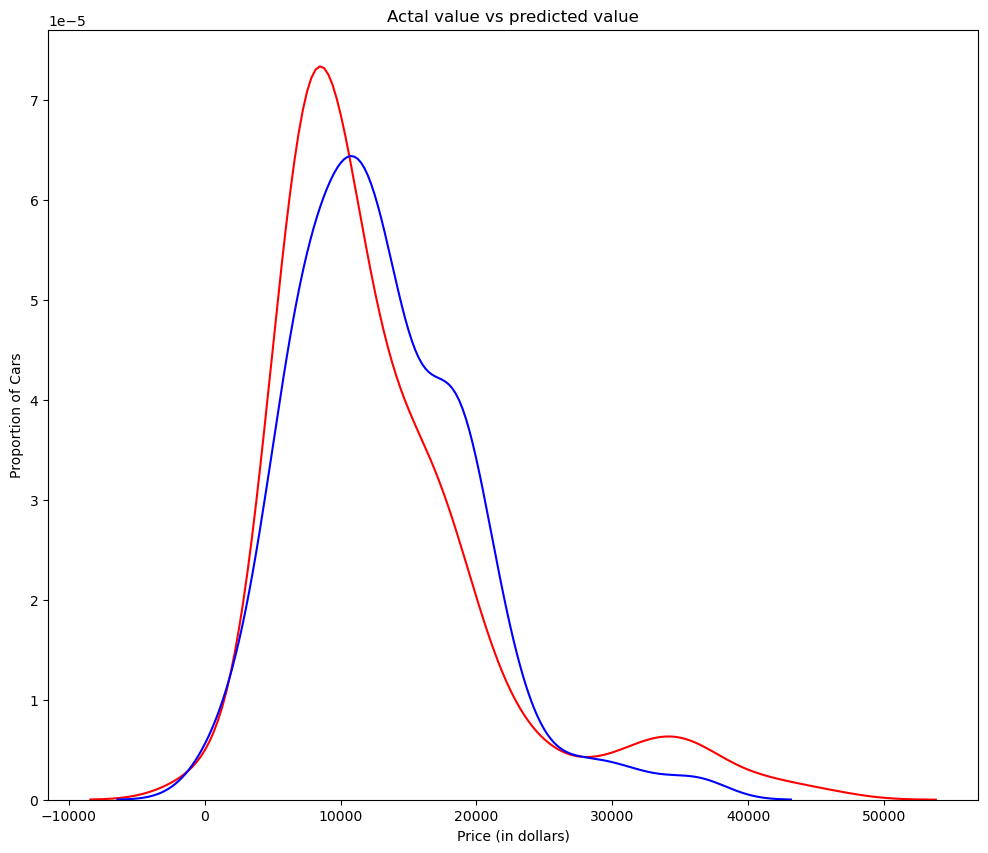

In [207]:
plt.pyplot.figure(figsize=(width,height))
ax1= sns.distplot(df2['price'],hist=False,color='r',label='Actual Label')
sns.distplot(Y_hat,color='b',hist=False,label='predicted price',ax=ax1)
plt.pyplot.xlabel('Price (in dollars)')
plt.pyplot.ylabel('Proportion of Cars')
plt.pyplot.title('Actal value vs predicted value')
plt.pyplot.show()
plt.pyplot.close()

 We can see that the fitted values are reasonably close to the actual values since the two distributions overlap a bit. However, there is definitely some room for improvement.

# 3. Polynomial Regression and Pipelines

Polynomial regression is a particular case of the general linear regression model or multiple linear regression models.

We get non-linear relationships by squaring or setting higher-order terms of the predictor variables.

There are different orders of polynomial regression:

 <center><b>Quadratic - 2nd Order</b></center>
$$
Yhat = a + b_1 X +b_2 X^2 
$$


<center><b>Cubic - 3rd Order</b></center>
$$
Yhat = a + b_1 X +b_2 X^2 +b_3 X^3\\\\
$$


<center><b>Higher-Order</b>:</center>
$$
Y = a + b_1 X +b_2 X^2 +b_3 X^3 ....\\
$$

We saw earlier that a linear model did not provide the best fit while using "highway-mpg" as the predictor variable. Let's see if we can try fitting a polynomial model to the data instead.

We will use the following function to plot the data:

In [208]:
x = df2['highway-mpg']
y = df2['price']

Let's fit the polynomial using the function polyfit, then use the function poly1d to display the polynomial function.




In [209]:
f= np.polyfit(x,y,1)
p =np.poly1d(f)
print(p)

 
3501 x - 1.497e+04


In [210]:
def plotpolly(model,independent_variable,dependent_variabble,name):
    x_new=np.linspace(15,55,100)
    y_new=model(x_new)

    plt.pyplot.plot(independent_variable,dependent_variabble,'.',x_new,y_new,'-')
    plt.pyplot.title('Polynomial Fit with Matplotlib for Price ~ Length')
    plt.pyplot.xlabel(name)
    plt.pyplot.ylabel('price')
    plt.pyplot.show()
    plt.pyplot.close()


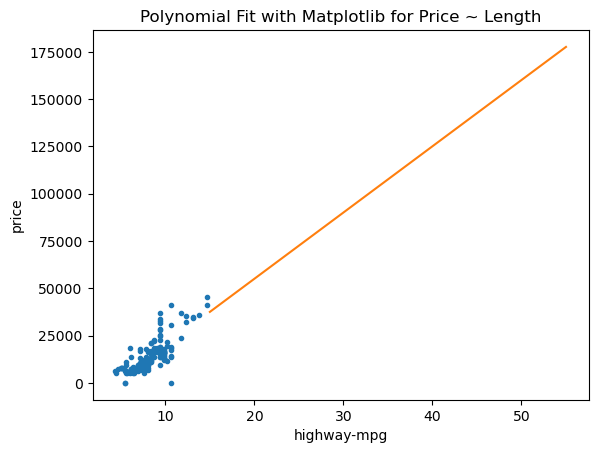

In [211]:
plotpolly(p,x,y,'highway-mpg')

In [212]:
f1 = np.polyfit(x, y, 11)
p1 = np.poly1d(f1)
print(p1)
PlotPolly(p1,x,y, 'Highway MPG')

          11          10         9         8             7
0.000644 x  - 0.1887 x  + 14.45 x - 552.4 x + 1.274e+04 x
              6             5             4             3             2
 - 1.922e+05 x + 1.967e+06 x - 1.378e+07 x + 6.516e+07 x - 1.987e+08 x + 3.525e+08 x - 2.763e+08


NameError: name 'PlotPolly' is not defined

The analytical expression for Multivariate Polynomial function gets complicated. For example, the expression for a second-order (degree=2) polynomial with two variables is given by:

$$
Yhat = a + b_1 X_1 +b_2 X_2 +b_3 X_1 X_2+b_4 X_1^2+b_5 X_2^2
$$


We can perform a polynomial transform on multiple features. First, we import the module:

In [213]:
from sklearn.preprocessing import PolynomialFeatures

We create a PolynomialFeatures object of degree 2:

In [214]:
pr=PolynomialFeatures(degree=2)
pr

PolynomialFeatures()

In [215]:
Z_pr=pr.fit_transform(Z)

NameError: name 'Z' is not defined

In [216]:
Z.shape

NameError: name 'Z' is not defined

In [217]:
Z_pr.shape

NameError: name 'Z_pr' is not defined

# Pipeline
Data Pipelines simplify the steps of processing the data. We use the module Pipeline to create a pipeline. We also use StandardScaler as a step in our pipeline.



In [218]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [219]:
Input=[('scale',StandardScaler()),('polynomaial',PolynomialFeatures(include_bias=False)),('LinearRegression',LinearRegression())]
Input

[('scale', StandardScaler()),
 ('polynomaial', PolynomialFeatures(include_bias=False)),
 ('LinearRegression', LinearRegression())]

In [220]:
Pipe=Pipeline(Input)
Pipe

Pipeline(steps=[('scale', StandardScaler()),
                ('polynomaial', PolynomialFeatures(include_bias=False)),
                ('LinearRegression', LinearRegression())])

First, we convert the data type Z to type float to avoid conversion warnings that may appear as a result of StandardScaler taking float inputs.

Then, we can normalize the data, perform a transform and fit the model simultaneously.

In [221]:
z1=Z.astype('float')
Pipe.fit(z1,y)

NameError: name 'Z' is not defined

In [222]:
ypipe=Pipe.predict(z1)
ypipe

NameError: name 'z1' is not defined

# 4. Measures for In-Sample Evaluation

<p>When evaluating our models, not only do we want to visualize the results, but we also want a quantitative measure to determine how accurate the model is.</p>

<p>Two very important measures that are often used in Statistics to determine the accuracy of a model are:</p>
<ul>
    <li><b>R^2 / R-squared</b></li>
    <li><b>Mean Squared Error (MSE)</b></li>
</ul>
    
<b>R-squared</b>

<p>R squared, also known as the coefficient of determination, is a measure to indicate how close the data is to the fitted regression line.</p>
    
<p>The value of the R-squared is the percentage of variation of the response variable (y) that is explained by a linear model.</p>



<b>Mean Squared Error (MSE)</b>

<p>The Mean Squared Error measures the average of the squares of errors. That is, the difference between actual value (y) and the estimated value (ŷ).</p>


# Model 1: Simple Linear Regression

Let's calculate the R^2:

In [223]:
lm.fit(X,Y)
# Find the R^2
print('The R-square is: ', lm.score(X, Y))

The R-square is:  0.7818468117050439


We can say that ~0.7818468117050439
% of the variation of the price is explained by this simple linear model "horsepower_fit".

In [224]:
Yhat=lm.predict(X)
print('The output of the first four predicted value is: ', Yhat[0:4])

The output of the first four predicted value is:  [12944.8485802  12944.8485802  16745.52821041 10284.36326112]


# Let's import the function mean_squared_error from the module metrics:

In [225]:
from sklearn.metrics import mean_squared_error

We can compare the predicted results with the actual results:

In [226]:
mse=mean_squared_error(df2['price'],Yhat)
print('The mean square error of price and predicted value is: ', mse)

The mean square error of price and predicted value is:  14258958.556050075


# Model 2: Multiple Linear Regression
Let's calculate the R^2:

In [227]:
# fit the model 
lm.fit(Z, df2['price'])
# Find the R^2
print('The R-square is: ', lm.score(Z, df2['price']))

NameError: name 'Z' is not defined

In [228]:
Y_predict_multifit = lm.predict(Z)

NameError: name 'Z' is not defined

We compare the predicted results with the actual results:




In [229]:
print('The mean square error of price and predicted value using multifit is: ', \
      mean_squared_error(df2['price'], Y_predict_multifit))

NameError: name 'Y_predict_multifit' is not defined

# Model 3: Polynomial Fit

Let's calculate the R^2.

### Let’s import the function r2_score from the module metrics as we are using a different function.

In [230]:
from sklearn.metrics import r2_score

We apply the function to get the value of R^2:


In [231]:
r_squared = r2_score(y, p(x))
print('The R-square value is: ', r_squared)

The R-square value is:  0.6331240556423086


We can say that ~0.6331240556423086 % of the variation of price is explained by this polynomial fit.

# MSE
We can also calculate the MSE

In [232]:
mean_squared_error(df2['price'], p(x))

23979795.69629333

# 5. Prediction and Decision Making

Prediction
In the previous section, we trained the model using the method fit. Now we will use the method predict to produce a prediction. Lets import pyplot for plotting; we will also be using some functions from numpy.

Decision Making: Determining a Good Model Fit
Now that we have visualized the different models, and generated the R-squared and MSE values for the fits, how do we determine a good model fit?

What is a good R-squared value?
When comparing models, the model with the higher R-squared value is a better fit for the data.

What is a good MSE?
When comparing models, the model with the smallest MSE value is a better fit for the data.

Let's take a look at the values for the different models.
Simple Linear Regression: Using Highway-mpg as a Predictor Variable of Price.

R-squared: 0.49659118843391759
MSE: 3.16 x10^7
Multiple Linear Regression: Using Horsepower, Curb-weight, Engine-size, and Highway-mpg as Predictor Variables of Price.

R-squared: 0.80896354913783497
MSE: 1.2 x10^7

Polynomial Fit: Using Highway-mpg as a Predictor Variable of Price.

R-squared: 0.6741946663906514
MSE: 2.05 x 10^7

# <h3>Simple Linear Regression Model (SLR) vs Multiple Linear Regression Model (MLR)</h3>

Usually, the more variables you have, the better your model is at predicting, but this is not always true. Sometimes you may not have enough data, you may run into numerical problems, or many of the variables may not be useful and even act as noise. As a result, you should always check the MSE and R^2.

In order to compare the results of the MLR vs SLR models, we look at a combination of both the R-squared and MSE to make the best conclusion about the fit of the model.

MSE: The MSE of SLR is 3.16x10^7 while MLR has an MSE of 1.2 x10^7. The MSE of MLR is much smaller.

R-squared: In this case, we can also see that there is a big difference between the R-squared of the SLR and the R-squared of the MLR. The R-squared for the SLR (~0.497) is very small compared to the R-squared for the MLR (~0.809).

This R-squared in combination with the MSE show that MLR seems like the better model fit in this case compared to SLR.

# Simple Linear Model (SLR) vs. Polynomial Fit
MSE: We can see that Polynomial Fit brought down the MSE, since this MSE is smaller than the one from the SLR.

R-squared: The R-squared for the Polynomial Fit is larger than the R-squared for the SLR, so the Polynomial Fit also brought up the R-squared quite a bit.

Since the Polynomial Fit resulted in a lower MSE and a higher R-squared, we can conclude that this was a better fit model than the simple linear regression for predicting "price" with "highway-mpg" as a predictor variable.

# Multiple Linear Regression (MLR) vs. Polynomial Fit






MSE: The MSE for the MLR is smaller than the MSE for the Polynomial Fit.

R-squared: The R-squared for the MLR is also much larger than for the Polynomial Fit.

# Conclusion
Comparing these three models, we conclude that the MLR model is the best model to be able to predict price from our dataset. This result makes sense since we have 27 variables in total and we know that more than one of those variables are potential predictors of the final car price.

# Model Evaluation and Refinement

Evaluate and refine prediction models

Table of Contents

    Model Evaluation
    Over-fitting, Under-fitting and Model Selection
    Ridge Regression
    Grid Search

In [233]:
import warnings
warnings.filterwarnings('ignore')

This line imports the warnings module in Python. The warnings module provides a way to control the display of warning messages issued by the Python interpreter.

warnings.filterwarnings('ignore')
This line sets up a filter for warnings, specifically instructing the interpreter to ignore (suppress) all warning messages.

By using warnings.filterwarnings('ignore'), you are telling Python to suppress any warnings that might be generated during the execution of your code. This can be useful in certain scenarios where you want to hide non-critical warnings or when you want to avoid cluttering the output with warning messages.

In [234]:
file1=r'C:\Users\Kapil\Downloads\module_5_auto.csv'

In [235]:
df_me=pd.read_csv(file1)

In [236]:
df_me

,Unnamed: 0.1,Unnamed: 0,symboling,normalized-losses,make,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,...,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,city-L/100km,horsepower-binned,diesel,gas
0,0,0,3,122,alfa-romero,std,two,convertible,rwd,front,88.6,0.811148,0.890278,...,mpfi,3.470000,2.68,9.00,111.000000,5000.000000,21,27,13495.0,11.190476,Medium,0,1
1,1,1,3,122,alfa-romero,std,two,convertible,rwd,front,88.6,0.811148,0.890278,...,mpfi,3.470000,2.68,9.00,111.000000,5000.000000,21,27,16500.0,11.190476,Medium,0,1
2,2,2,1,122,alfa-romero,std,two,hatchback,rwd,front,94.5,0.822681,0.909722,...,mpfi,2.680000,3.47,9.00,154.000000,5000.000000,19,26,16500.0,12.368421,Medium,0,1
3,3,3,2,164,audi,std,four,sedan,fwd,front,99.8,0.848630,0.919444,...,mpfi,3.190000,3.40,10.00,102.000000,5500.000000,24,30,13950.0,9.791667,Medium,0,1
4,4,4,2,164,audi,std,four,sedan,4wd,front,99.4,0.848630,0.922222,...,mpfi,3.190000,3.40,8.00,115.000000,5500.000000,18,22,17450.0,13.055556,Medium,0,1
5,5,5,2,122,audi,std,two,sedan,fwd,front,99.8,0.851994,0.920833,...,mpfi,3.190000,3.40,8.50,110.000000,5500.000000,19,25,15250.0,12.368421,Medium,0,1
6,6,6,1,158,audi,std,four,sedan,fwd,front,105.8,0.925997,0.991667,...,mpfi,3.190000,3.40,8.50,110.000000,5500.000000,19,25,17710.0,12.368421,Medium,0,1
7,7,7,1,122,audi,std,four,wagon,fwd,front,105.8,0.925997,0.991667,...,mpfi,3.190000,3.40,8.50,110.000000,5500.000000,19,25,18920.0,12.368421,Medium,0,1
8,8,8,1,158,audi,turbo,four,sedan,fwd,front,105.8,0.925997,0.991667,...,mpfi,3.130000,3.40,8.30,140.000000,5500.000000,17,20,23875.0,13.823529,Medium,0,1
9,9,9,2,192,bmw,std,two,sedan,rwd,front,101.2,0.849592,0.900000,...,mpfi,3.500000,2.80,8.80,101.000000,5800.000000,23,29,16430.0,10.217391,Low,0,1


In [237]:
df_me.drop(['Unnamed: 0.1','Unnamed: 0'],axis=1,inplace=True)

In [238]:
df_me

,symboling,normalized-losses,make,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,...,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,city-L/100km,horsepower-binned,diesel,gas
0,3,122,alfa-romero,std,two,convertible,rwd,front,88.6,0.811148,0.890278,48.8,2548,...,mpfi,3.470000,2.68,9.00,111.000000,5000.000000,21,27,13495.0,11.190476,Medium,0,1
1,3,122,alfa-romero,std,two,convertible,rwd,front,88.6,0.811148,0.890278,48.8,2548,...,mpfi,3.470000,2.68,9.00,111.000000,5000.000000,21,27,16500.0,11.190476,Medium,0,1
2,1,122,alfa-romero,std,two,hatchback,rwd,front,94.5,0.822681,0.909722,52.4,2823,...,mpfi,2.680000,3.47,9.00,154.000000,5000.000000,19,26,16500.0,12.368421,Medium,0,1
3,2,164,audi,std,four,sedan,fwd,front,99.8,0.848630,0.919444,54.3,2337,...,mpfi,3.190000,3.40,10.00,102.000000,5500.000000,24,30,13950.0,9.791667,Medium,0,1
4,2,164,audi,std,four,sedan,4wd,front,99.4,0.848630,0.922222,54.3,2824,...,mpfi,3.190000,3.40,8.00,115.000000,5500.000000,18,22,17450.0,13.055556,Medium,0,1
5,2,122,audi,std,two,sedan,fwd,front,99.8,0.851994,0.920833,53.1,2507,...,mpfi,3.190000,3.40,8.50,110.000000,5500.000000,19,25,15250.0,12.368421,Medium,0,1
6,1,158,audi,std,four,sedan,fwd,front,105.8,0.925997,0.991667,55.7,2844,...,mpfi,3.190000,3.40,8.50,110.000000,5500.000000,19,25,17710.0,12.368421,Medium,0,1
7,1,122,audi,std,four,wagon,fwd,front,105.8,0.925997,0.991667,55.7,2954,...,mpfi,3.190000,3.40,8.50,110.000000,5500.000000,19,25,18920.0,12.368421,Medium,0,1
8,1,158,audi,turbo,four,sedan,fwd,front,105.8,0.925997,0.991667,55.9,3086,...,mpfi,3.130000,3.40,8.30,140.000000,5500.000000,17,20,23875.0,13.823529,Medium,0,1
9,2,192,bmw,std,two,sedan,rwd,front,101.2,0.849592,0.900000,54.3,2395,...,mpfi,3.500000,2.80,8.80,101.000000,5800.000000,23,29,16430.0,10.217391,Low,0,1


In [239]:
from ipywidgets import interact, interactive, fixed, interact_manual

The ipywidgets library provides interactive widgets for the Jupyter Notebook, allowing you to create interactive user interfaces directly within your notebook. The specific functions you mentioned, interact, interactive, fixed, and interact_manual, are part of this library and are used to create interactive widgets easily.

In [240]:
def DistributionPlot(RedFunction,BlueFunction,RedName,BlueName,Title):
    width=12
    height=10
    plt.pyplot.figure(figsize=(width,height))
    ax1=sns.kdeplot(RedFunction,color='r',label=RedName)
    ax2=sns.kdeplot(BlueFunction,color='b',label=BlueName,ax=ax1)
    plt.pyplot.title(Title)
    plt.pyplot.xlabel('Price (in dollars)')
    plt.pyplot.ylabel('Proportion of Cars')
    plt.pyplot.show()
    plt.pyplot.close()

In [279]:
def PollyPlot(xtrain, xtest, y_train, y_test, lr,poly_transform):
    width = 12
    height = 10
    plt.pyplot.figure(figsize=(width, height))
    
    #training data 
    #testing data 
    # lr:  linear regression object 
    #poly_transform:  polynomial transformation object 
 
    xmax=max([xtrain.values.max(), xtest.values.max()])

    xmin=min([xtrain.values.min(), xtest.values.min()])

    x=np.arange(xmin, xmax, 0.1)

    
    plt.pyplot.plot(xtrain, y_train, 'ro', label='Training Data')
    plt.pyplot.plot(xtest, y_test, 'go', label='Test Data')
    plt.pyplot.plot(x, lr.predict(poly_transform.fit_transform(x.reshape(-1, 1))), label='Predicted Function')
    plt.pyplot.ylim([-10000, 60000])
    plt.pyplot.ylabel('Price')
    plt.pyplot.legend()

# Part 1: Training and Testing
An important step in testing your model is to split your data into training and testing data. We will place the target data price in a separate dataframe y_data:

In [242]:
y_data = df_me['price']

# Drop price data in dataframe x_data:


In [243]:
x_data=df_me.drop('price',axis=1)

### Now, we randomly split our data into training and testing data using the function train_test_split.

In [244]:
from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test = train_test_split(x_data,y_data, test_size=0.10 , random_state=1)

print('number of training samples ', x_train.shape[0] )
print('number of test samples ', x_test.shape[0])

number of training samples  180
number of test samples  21


the test_size parameter sets the proportion of data that is split into the testing set. In the above, the testing set is 10% of the total dataset.

Use the function "train_test_split" to split up the dataset such that 40% of the data samples will be utilized for testing. Set the parameter "random_state" equal to zero. The output of the function should be the following: "x_train1" , "x_test1", "y_train1" and "y_test1".


In machine learning, the train_test_split function is commonly used to split a dataset into training and testing sets. The random_state parameter is used to ensure reproducibility of the split. Setting a specific random_state value will produce the same split every time the code is run.

Here's how it works:

When you set random_state to a specific integer (e.g., random_state=1), the split is determined based on that specific seed value.

Using the same random_state ensures that the data is split in the same way every time you run the code, making your results reproducible.

If you don't set random_state, the split will be different each time you run the code, which might not be desirable if you want reproducibility for testing and debugging.

By setting random_state to a fixed value, you can share your code with others, and they will obtain the same split when using the same seed.

In [245]:
x_train1,x_test1,y_train1,y_test1=train_test_split(x_data,y_data,test_size=0.4,random_state=0)
print('number of training samples ', x_train1.shape[0] )
print('number of test samples ', x_test1.shape[0])

number of training samples  120
number of test samples  81


# Let's import LinearRegression from the module linear_model.

In [246]:
# from sklearn.linear_model import LinearRegression()
lre= LinearRegression()

We fit the model using the feature "horsepower":

In [247]:
lre.fit(x_train[['horsepower']],y_train)

LinearRegression()

In [248]:
lre.score(x_test[['horsepower']],y_test)

0.3635875575078824

We can see the R^2 is much smaller using the test data compared to the training data.

In [249]:
lre.score(x_train[['horsepower']],y_train)

0.6619724197515103

In [250]:
x_train1,x_test1,y_train1,y_test1=train_test_split(x_data,y_data,test_size=0.4,random_state=0)
lre.fit(x_train1[['horsepower']],y_train1)
lre.score(x_test1[['horsepower']],y_test1)

0.7139364665406973

Sometimes you do not have sufficient testing data; as a result, you may want to perform cross-validation. Let's go over several methods that you can use for cross-validation


Cross-validation is a technique used in machine learning to assess the performance and generalization ability of a model. Cross-validation score, often computed using functions like `cross_val_score` in scikit-learn, provides a more reliable estimate of a model's performance than a single train-test split. Here are some reasons why cross-validation score is commonly used:

1. **Robust Performance Evaluation:**
   - Cross-validation helps reduce the impact of the randomness in a single train-test split. It provides a more stable and robust estimate of a model's performance by averaging performance metrics over multiple splits.

2. **Better Utilization of Data:**
   - In a typical train-test split, a portion of the data is used for training, and another portion is used for testing. Cross-validation divides the data into multiple folds, ensuring that each data point is used for both training and testing. This leads to a more efficient use of the available data.

3. **Reduced Variance in Performance Estimates:**
   - Performance metrics obtained from a single train-test split might vary depending on which data points end up in the training or test set. Cross-validation reduces this variance by averaging the performance over multiple splits, providing a more reliable estimate.

4. **Model Selection and Hyperparameter Tuning:**
   - Cross-validation is commonly used in model selection and hyperparameter tuning. By comparing the cross-validation scores of different models or hyperparameter configurations, one can choose the model or settings that generalize well to unseen data.

5. **Detection of Overfitting or Underfitting:**
   - Cross-validation helps identify whether a model is overfitting or underfitting. If a model performs well on the training data but poorly on the validation sets, it might be overfitting. Cross-validation allows you to detect such issues.

6. **More Comprehensive Evaluation:**
   - Cross-validation provides a more comprehensive evaluation of a model's performance across different subsets of the data. This is particularly important when the dataset is limited or imbalanced.

In summary, cross-validation score is widely used because it offers a more robust and reliable estimate of a model's performance, allowing practitioners to make informed decisions about model selection, hyperparameter tuning, and generalization.

# Cross-Validation Score

In [251]:
from sklearn.model_selection import cross_val_score

We input the object, the feature ("horsepower"), and the target data (y_data). The parameter 'cv' determines the number of folds. In this case, it is 4.

In [252]:
Rcross=cross_val_score(lre,x_data[['horsepower']],y_data,cv=4)
Rcross

array([0.7746232 , 0.51716687, 0.74785353, 0.04839605])

We can calculate the average and standard deviation of our estimate:

In [253]:
print('the mean of the folds are ',Rcross.mean() , ' the std deviation of the folds are  ',Rcross.std())

the mean of the folds are  0.5220099150421194  the std deviation of the folds are   0.2911839444756025


We can use negative squared error as a score by setting the parameter 'scoring' metric to 'neg_mean_squared_error'.

In [254]:
-1 * cross_val_score(lre,x_data[['horsepower']], y_data,cv=4,scoring='neg_mean_squared_error')

array([20254142.84026704, 43745493.26505169, 12539630.34014931,
       17561927.72247589])

In [255]:
rc=cross_val_score(lre,x_data[['horsepower']],y_data,cv=2)
rc.mean()

0.5166761697127429

In [256]:
rc

array([0.59015621, 0.44319613])

You can also use the function 'cross_val_predict' to predict the output. The function splits up the data into the specified number of folds, with one fold for testing and the other folds are used for training. First, import the function:



In [257]:
from sklearn.model_selection import cross_val_predict

We input the object, the feature "horsepower", and the target data y_data. The parameter 'cv' determines the number of folds. In this case, it is 4. We can produce an output:

In [258]:
yhat=cross_val_predict(lre,x_data[['horsepower']],y_data,cv=4)
yhat

array([14141.63807508, 14141.63807508, 20814.29423473, 12745.03562306,
       14762.35027598, 13986.46002486, 13986.46002486, 13986.46002486,
       18641.80153159, 12589.85757284, 12589.85757284, 15693.41857732,
       15693.41857732, 15693.41857732, 25159.27964101, 25159.27964101,
       25159.27964101,  4365.42091095,  7779.33801589,  7779.33801589,
        7468.98191544,  7468.98191544, 12745.03562306,  7468.98191544,
        7468.98191544,  7468.98191544, 12745.03562306, 10572.54291992,
       19417.69178271,  5917.2014132 ,  8710.40631723,  6227.55751364,
        8710.40631723,  8710.40631723,  8710.40631723,  8710.40631723,
       10262.18681948, 10262.18681948, 10262.18681948, 10262.18681948,
       12589.85757284, 12434.67952262,  9020.76241768, 10882.89902037,
       24228.21133966, 24228.21133966, 37573.52365895,  7468.98191544,
        7468.98191544,  7468.98191544,  7468.98191544,  7191.77534249,
       12625.21956696, 12625.21956696, 12625.21956696, 18223.31361641,
      

# Part 2: Overfitting, Underfitting and Model Selection
It turns out that the test data, sometimes referred to as the "out of sample data", is a much better measure of how well your model performs in the real world. One reason for this is overfitting.

Let's go over some examples. It turns out these differences are more apparent in Multiple Linear Regression and Polynomial Regression so we will explore overfitting in that context.

Let's create Multiple Linear Regression objects and train the model using 'horsepower', 'curb-weight', 'engine-size' and 'highway-mpg' as features.'

In [259]:
lr=LinearRegression()
lr.fit(x_train[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']],y_train)

LinearRegression()

Prediction using training data:

In [260]:
yhat_train= lr.predict(x_train[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']])
yhat_train

array([ 7426.6731551 , 28323.75090803, 14213.38819709,  4052.34146983,
       34500.19124244, 16095.58976762,  5493.39946597, 11664.79793006,
        6807.18648404, 16475.73097131, 11900.73825159, 11249.96609558,
        6397.42659407, 21973.85044348, 16810.56839134, 11862.6061902 ,
        9008.87056451, 22619.74131659, 24059.5484705 ,  9018.1261375 ,
       15082.57584248, 18350.42705689, 11105.21810781, 27230.63173951,
       11105.21810781,  5866.69339839,  5899.59841145, 10153.64235711,
       23309.06009275, 13364.54429294, 19047.41293694,  5920.65552212,
       11846.91343671,  7351.3699873 ,  6359.62662523,  7015.65736686,
        7306.64248026, 17320.73044874, 17028.92516735, 10516.44416856,
       29686.45351371,  6753.3796298 ,  6927.73512425,  9564.87373579,
         651.26444019, 14082.75866765,  9708.96012797, 23451.67806289,
        5692.64897207, 22921.32655392, 18452.50074365,  7372.06493124,
       21399.38941488, 14964.81874602,  7498.04911771, 16240.45437519,
      

Prediction using test data:

In [261]:
yhat_train = lr.predict(x_train[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']])
yhat_train[0:5]

array([ 7426.6731551 , 28323.75090803, 14213.38819709,  4052.34146983,
       34500.19124244])

In [262]:
yhat_test = lr.predict(x_test[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']])
yhat_test[0:5]

array([11349.35089149,  5884.11059106, 11208.6928275 ,  6641.07786278,
       15565.79920282])

Let's examine the distribution of the predicted values of the training data.

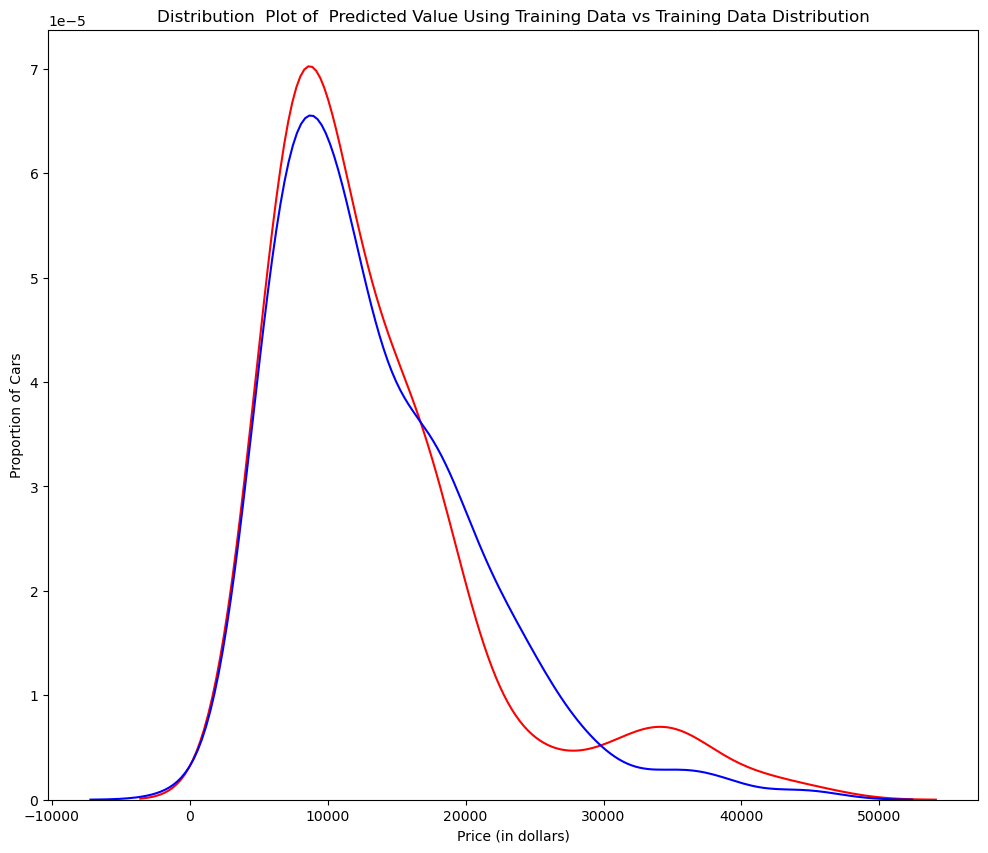

In [263]:
Title = 'Distribution  Plot of  Predicted Value Using Training Data vs Training Data Distribution'
DistributionPlot(y_train,yhat_train, "Actual Values (Train)", "Predicted Values (Train)", Title)

Figure 1: Plot of predicted values using the training data compared to the actual values of the training data.

So far, the model seems to be doing well in learning from the training dataset. But what happens when the model encounters new data from the testing dataset? When the model generates new values from the test data, we see the distribution of the predicted values is much different from the actual target values.

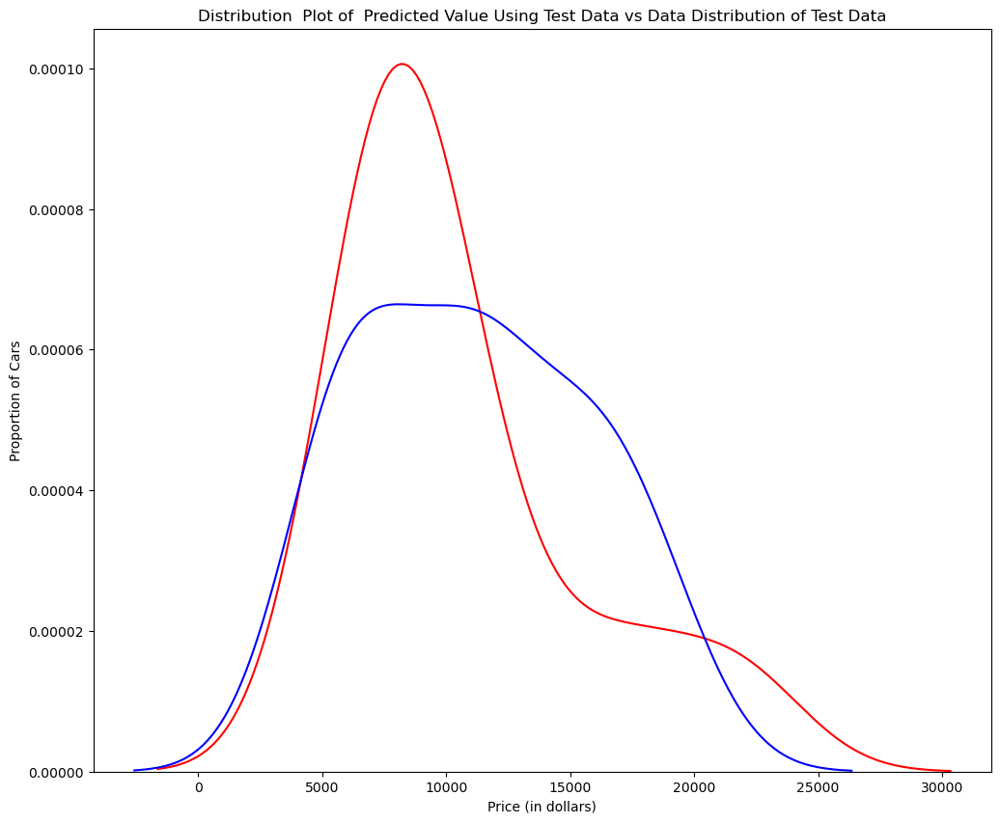

In [264]:
Title='Distribution  Plot of  Predicted Value Using Test Data vs Data Distribution of Test Data'
DistributionPlot(y_test,yhat_test,"Actual Values (Test)","Predicted Values (Test)",Title)

Figure 2: Plot of predicted value using the test data compared to the actual values of the test data.

Comparing Figure 1 and Figure 2, it is evident that the distribution of the test data in Figure 1 is much better at fitting the data. This difference in Figure 2 is apparent in the range of 5000 to 15,000. This is where the shape of the distribution is extremely different. Let's see if polynomial regression also exhibits a drop in the prediction accuracy when analysing the test dataset.



In [265]:
from sklearn.preprocessing import PolynomialFeatures

Overfitting
Overfitting occurs when the model fits the noise, but not the underlying process. Therefore, when testing your model using the test set, your model does not perform as well since it is modelling noise, not the underlying process that generated the relationship. Let's create a degree 5 polynomial model.

Let's use 55 percent of the data for training and the rest for testing:

In [266]:
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.45, random_state=0)

We will perform a degree 5 polynomial transformation on the feature 'horsepower'.

In [267]:
pr=PolynomialFeatures(degree=5)
x_train_pr = pr.fit_transform(x_train[['horsepower']])
x_test_pr = pr.fit_transform(x_test[['horsepower']])
pr

PolynomialFeatures(degree=5)

Now, let's create a Linear Regression model "poly" and train it.

In [268]:
poly = LinearRegression()
poly.fit(x_train_pr, y_train)

LinearRegression()

In [269]:
yhat = poly.predict(x_test_pr)
yhat[0:5]

array([ 6728.77492727,  7308.09738048, 12213.83912148, 18893.06269972,
       19995.73316497])

Let's take the first five predicted values and compare it to the actual targets.

In [270]:
print("Predicted values:", yhat[0:4])
print("True values:", y_test[0:4].values)

Predicted values: [ 6728.77492727  7308.09738048 12213.83912148 18893.06269972]
True values: [ 6295. 10698. 13860. 13499.]


We will use the function "PollyPlot" that we defined at the beginning to display the training data, testing data, and the predicted function.


In [271]:
%matplotlib inline

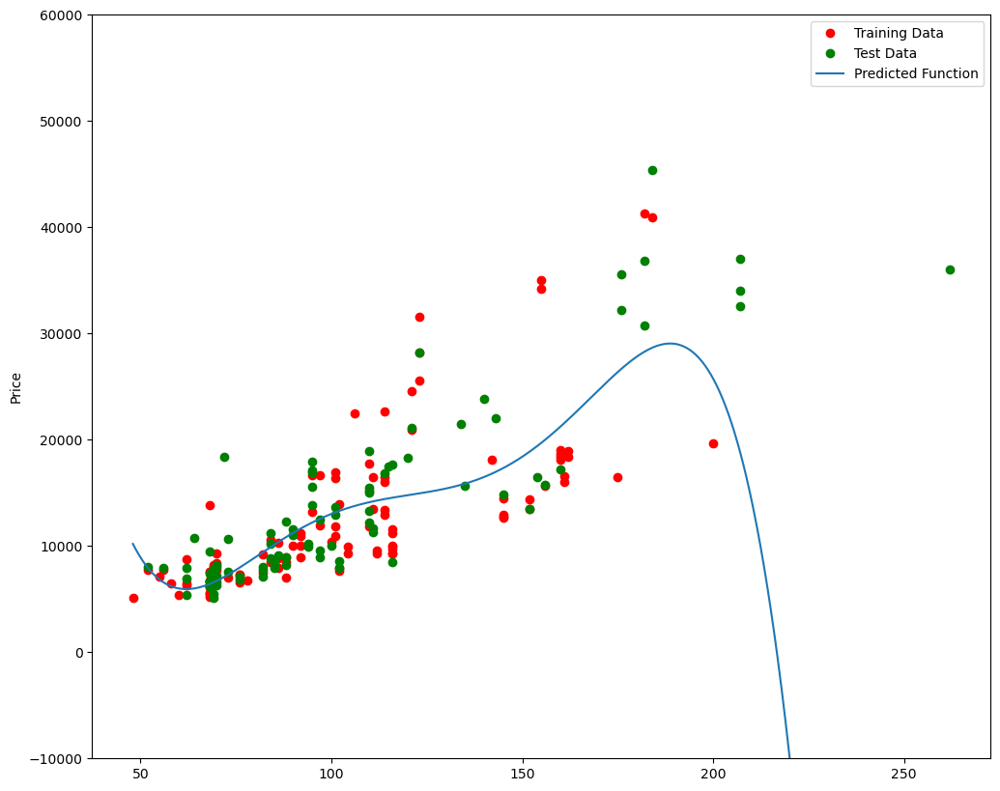

In [280]:
PollyPlot(x_train['horsepower'], x_test['horsepower'], y_train, y_test, poly,pr)

Figure 3: A polynomial regression model where red dots represent training data, green dots represent test data, and the blue line represents the model prediction.

We see that the estimated function appears to track the data but around 200 horsepower, the function begins to diverge from the data points.

R^2 of the training data:

In [273]:
poly.score(x_train_pr, y_train)

0.5567716899817778

R^2 of the test data:

In [281]:
poly.score(x_test_pr, y_test)

-29.871838229908324

We see the R^2 for the training data is 0.5567 while the R^2 on the test data was -29.87. The lower the R^2, the worse the model. A negative R^2 is a sign of overfitting

Let's see how the R^2 changes on the test data for different order polynomials and then plot the results:



the r2 is  0.40639663674298854


Text(3, 0.75, 'Maximum R^2 ')

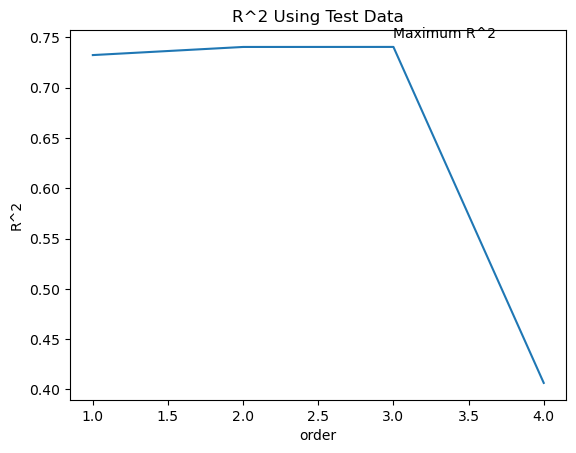

In [286]:
Rsqu_test = []

order = [1, 2, 3, 4]
for n in order:
    pr = PolynomialFeatures(degree=n)
    
    x_train_pr = pr.fit_transform(x_train[['horsepower']])
    
    x_test_pr = pr.fit_transform(x_test[['horsepower']])    
    
    lr.fit(x_train_pr, y_train)
    
    Rsqu_test.append(lr.score(x_test_pr, y_test))

plt.pyplot.plot(order, Rsqu_test)
print ('the r2 is ', lr.score(x_test_pr, y_test))
plt.pyplot.xlabel('order')
plt.pyplot.ylabel('R^2')
plt.pyplot.title('R^2 Using Test Data')
plt.pyplot.text(3, 0.75, 'Maximum R^2 ')  

We see the R^2 gradually increases until an order three polynomial is used. Then, the R^2 dramatically decreases at an order four polynomial.

The following function will be used in the next section. Please run the cell below.

In [287]:
def f(order, test_data):
    x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=test_data, random_state=0)
    pr = PolynomialFeatures(degree=order)
    x_train_pr = pr.fit_transform(x_train[['horsepower']])
    x_test_pr = pr.fit_transform(x_test[['horsepower']])
    poly = LinearRegression()
    poly.fit(x_train_pr,y_train)
    PollyPlot(x_train['horsepower'], x_test['horsepower'], y_train, y_test, poly,pr)

The following interface allows you to experiment with different polynomial orders and different amounts of data

In [289]:
interact(f, order=(0, 6, 1), test_data=(0.05, 0.95, 0.05))

interactive(children=(IntSlider(value=3, description='order', max=6), FloatSlider(value=0.45, description='tes…

<function __main__.f(order, test_data)>

We can perform polynomial transformations with more than one feature. Create a "PolynomialFeatures" object "pr1" of degree two.




In [290]:
pr1=PolynomialFeatures(degree=2)

In [291]:
x_train_pr1=pr1.fit_transform(x_train[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']])

x_test_pr1=pr1.fit_transform(x_test[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']])


In [292]:
x_train_pr1.shape

(110, 15)

In [293]:
poly1=LinearRegression().fit(x_train_pr1,y_train)

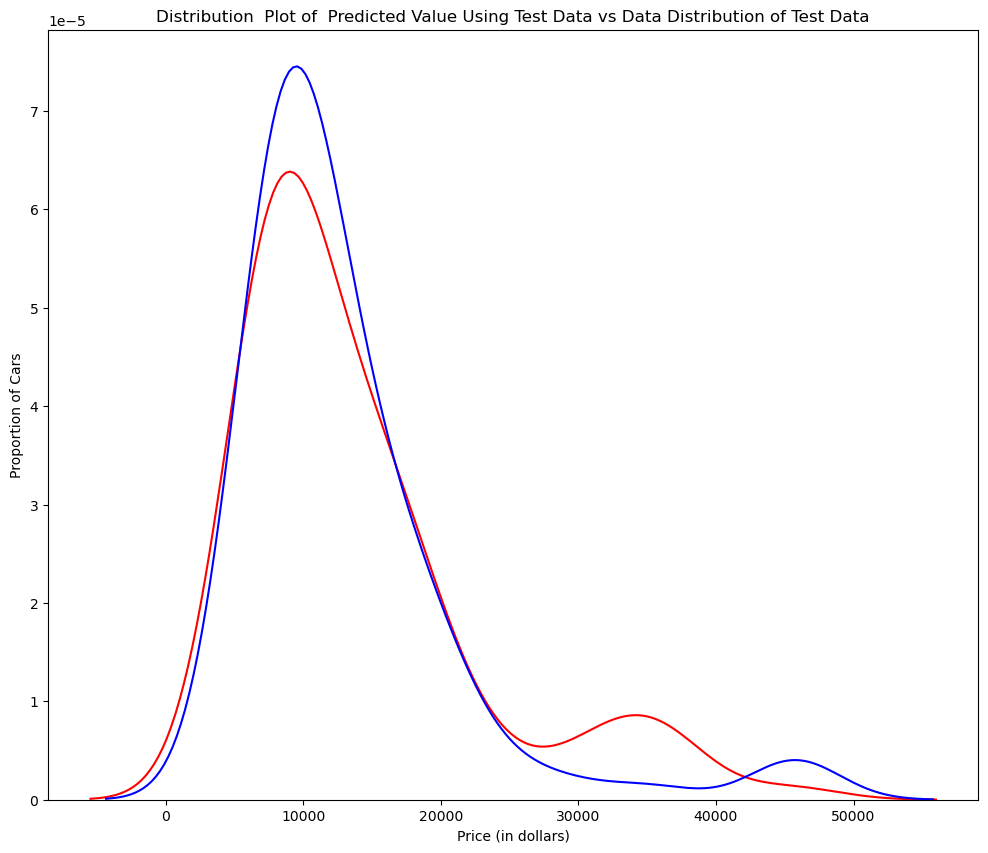

In [294]:
yhat_test1=poly1.predict(x_test_pr1)

Title='Distribution  Plot of  Predicted Value Using Test Data vs Data Distribution of Test Data'

DistributionPlot(y_test, yhat_test1, "Actual Values (Test)", "Predicted Values (Test)", Title)

The predicted value is higher than actual value for cars where the price $10,000 range, conversely the predicted price is lower than the price cost in the $30,000 to $40,000 range. As such the model is not as accurate in these range

# Part 3: Ridge Regression
In this section, we will review Ridge Regression and see how the parameter alpha changes the model. Just a note, here our test data will be used as validation data.

Let's perform a degree two polynomial transformation on our data.

In [295]:
pr=PolynomialFeatures(degree=2)
x_train_pr=pr.fit_transform(x_train[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg','normalized-losses','symboling']])
x_test_pr=pr.fit_transform(x_test[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg','normalized-losses','symboling']])

In [296]:
from sklearn.linear_model import Ridge

Let's create a Ridge regression object, setting the regularization parameter (alpha) to 0.1

In [297]:
RigeModel=Ridge(alpha=1)

Like regular regression, you can fit the model using the method fit.



In [298]:
RigeModel.fit(x_train_pr, y_train)

Ridge(alpha=1)

Similarly, you can obtain a prediction:

In [299]:
yhat = RigeModel.predict(x_test_pr)

Let's compare the first five predicted samples to our test set:

In [301]:
print('predicted:', yhat[0:4])
print('test set :', y_test[0:4].values)

predicted: [ 6570.82441941  9636.24891471 20949.92322737 19403.60313255]
test set : [ 6295. 10698. 13860. 13499.]


We select the value of alpha that minimizes the test error. To do so, we can use a for loop. We have also created a progress bar to see how many iterations we have completed so far.

In [302]:
from tqdm import tqdm

Rsqu_test = []
Rsqu_train = []
dummy1 = []
Alpha = 10 * np.array(range(0,1000))
pbar = tqdm(Alpha)

for alpha in pbar:
    RigeModel = Ridge(alpha=alpha) 
    RigeModel.fit(x_train_pr, y_train)
    test_score, train_score = RigeModel.score(x_test_pr, y_test), RigeModel.score(x_train_pr, y_train)
    
    pbar.set_postfix({"Test Score": test_score, "Train Score": train_score})

    Rsqu_test.append(test_score)
    Rsqu_train.append(train_score)

100%|████████████████████████████████████████| 1000/1000 [00:06<00:00, 163.81it/s, Test Score=0.564, Train Score=0.859]


We can plot out the value of R^2 for different alphas:

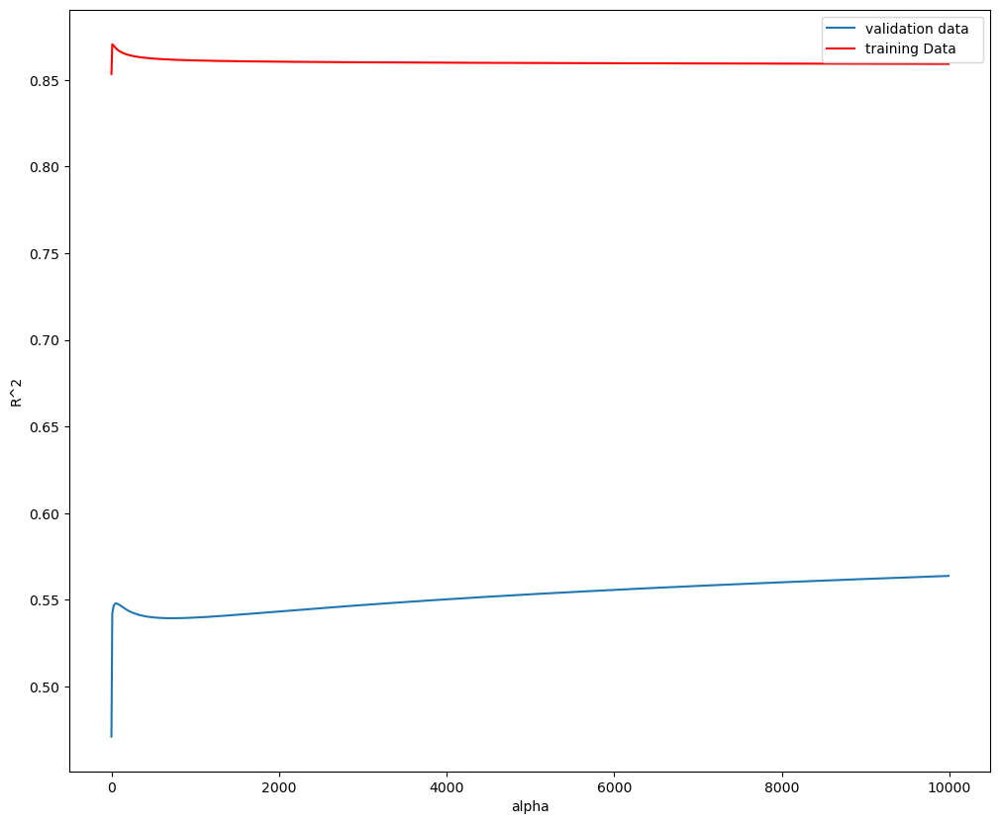

In [305]:
width = 12
height = 10
plt.pyplot.figure(figsize=(width, height))

plt.pyplot.plot(Alpha,Rsqu_test, label='validation data  ')
plt.pyplot.plot(Alpha,Rsqu_train, 'r', label='training Data ')
plt.pyplot.xlabel('alpha')
plt.pyplot.ylabel('R^2')
plt.pyplot.legend()

Figure 4: The blue line represents the R^2 of the validation data, and the red line represents the R^2 of the training data. The x-axis represents the different values of Alpha.

Here the model is built and tested on the same data, so the training and test data are the same.

The red line in Figure 4 represents the R^2 of the training data. As alpha increases the R^2 decreases. Therefore, as alpha increases, the model performs worse on the training data

The blue line represents the R^2 on the validation data. As the value for alpha increases, the R^2 increases and converges at a point.

In [306]:
RigeModel = Ridge(alpha=10) 
RigeModel.fit(x_train_pr, y_train)
RigeModel.score(x_test_pr, y_test)

0.5418576440207541

# Part 4: Grid Search
The term alpha is a hyperparameter. Sklearn has the class GridSearchCV to make the process of finding the best hyperparameter simpler.

Let's import GridSearchCV from the module model_selection.

In [307]:
from sklearn.model_selection import GridSearchCV

In [308]:
parameters1= [{'alpha': [0.001,0.1,1, 10, 100, 1000, 10000, 100000, 100000]}]
parameters1

[{'alpha': [0.001, 0.1, 1, 10, 100, 1000, 10000, 100000, 100000]}]

In [309]:
RR=Ridge()
RR

Ridge()

In [310]:
Grid1 = GridSearchCV(RR, parameters1,cv=4)

In [311]:
Grid1.fit(x_data[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']], y_data)

GridSearchCV(cv=4, estimator=Ridge(),
             param_grid=[{'alpha': [0.001, 0.1, 1, 10, 100, 1000, 10000, 100000,
                                    100000]}])

The object finds the best parameter values on the validation data. We can obtain the estimator with the best parameters and assign it to the variable BestRR as follows:

In [312]:
BestRR=Grid1.best_estimator_
BestRR

Ridge(alpha=10000)

We now test our model on the test data:

In [314]:
BestRR.score(x_test[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']], y_test)

0.8411649831036149

In [315]:
parameters2 = [{'alpha': [0.001, 0.1, 1, 10, 100, 1000, 10000, 100000, 100000]}]

Grid2 = GridSearchCV(Ridge(), parameters2, cv=4)
Grid2.fit(x_data[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']], y_data)
best_alpha = Grid2.best_params_['alpha']
best_ridge_model = Ridge(alpha=best_alpha)
best_ridge_model.fit(x_data[['horsepower', 'curb-weight', 'engine-size', 'highway-mpg']], y_data)

Ridge(alpha=10000)

1. **Ridge Regression:**
   - Ridge Regression is a linear regression technique that incorporates regularization to prevent overfitting.
   - It adds a penalty term to the linear regression objective function, which is proportional to the square of the magnitude of the coefficients.
   - The regularization term helps to shrink the coefficients, preventing them from becoming too large.
   - The regularization strength is controlled by the hyperparameter alpha.

2. **Grid Search:**
   - Grid Search is a technique used for hyperparameter tuning.
   - It involves selecting a subset of the hyperparameter space and searching over all possible combinations of hyperparameter values within that subset.
   - This method is used to find the optimal set of hyperparameters for a machine learning model.
   - It is particularly useful when there are multiple hyperparameters to tune.

**Difference:**
   - **Ridge Regression is a specific regression technique:** It's a method for modeling the relationship between a dependent variable and one or more independent variables.
   - **Grid Search is a hyperparameter tuning technique:** It's a method for finding the best hyperparameter values for a machine learning model.

In practical terms, you might use Grid Search to find the optimal alpha value for Ridge Regression. You define a grid of alpha values, and Grid Search helps you determine which alpha value gives the best performance according to a chosen evaluation metric.

If you have further questions or if there's a specific aspect you'd like more details on, feel free to ask!